# This notebook will help you to do:
* Import training and test data
* Univariate Analysis
* Bivariate Analysis
* Run many ML algorithms using H2O
* Compare all model performance in test dataset
* Choosing the best model
* Interpret model output with Shapley Value

## The Titanic dataset will be used for this demonstration

# 1. Parameters and Libraries

In [1]:
#Model ID
ModelId='Titanic_FML_v1'

#Setting the model target variable name
var_target = 'survived'

#process outputs such as MOJO model, images and performance of tested models
OutputPath='C:/tmp'

#If you have a huge dataset, I should consider use a small sample for first execution
pct_sample_size = 1

# 2. Import Libraries

In [2]:
import glob
import functools
import datetime as dt
import pandas as pd
import numpy as np
import h2o
import matplotlib.pyplot as plt
import shap
from pandas_profiling import ProfileReport
from collections import defaultdict
from pandas_profiling.model.base import get_var_type
import seaborn as sns
import os
import random

# 3. Importing Data for Modeling

In [3]:
#Import bases with features for modeling
#In this case we will use titanic dataset available below
dataprep_df_full = pd.read_csv('https://storage.googleapis.com/tf-datasets/titanic/train.csv')
#The target variavle must be integer 0 or 1

dataprep_df_full['survived'] = dataprep_df_full['survived'].astype(int)

### It is necessary to create a variable to indicate the records used in training and testing. In this case we will use the random variable, but you can use a date variable for exemple if you have a base with a reference date to fix the training base as an out of time validation.

In [4]:
random.seed(59354518745)
for i in range(len(dataprep_df_full)):
    dataprep_df_full.loc[i, ('random')] = random.random()
dataprep_df_full['dataset'] = ['train' if x <= 0.85 else 'test' for x in dataprep_df_full['random']]

In [5]:
#Work with a sample data if the pct_sample_size is less than 1
if pct_sample_size == 1:
    dataprep_df = dataprep_df_full
else:    
    dataprep_df = dataprep_df_full.sample(frac=pct_sample_size, replace=False, random_state=1)

## 3.1 Feature Engineering

In [6]:
dataprep_df['fareLog'] = np.log(dataprep_df['fare'])
dataprep_df['ageLog'] = np.log(dataprep_df['age'])

dataprep_df['fareX2'] = np.square(dataprep_df['fare'])
dataprep_df['ageX2'] = np.square(dataprep_df['age'])

divide by zero encountered in log


# 4. Univariate Analysis

## 4.1 Pandas Profiling

##### For more details on the pandas profiling library see https://github.com/pandas-profiling/pandas-profiling


In [7]:
#Generate report
#If the database has many records or columns, the report can take a long time
#If this is the case, disable the explorative, samples, correlations, missing_diagrams, duplicates and interactions options by commenting out
profile = ProfileReport(dataprep_df, title=f"Pandas Profiling Report{ModelId}"
                        ,explorative=True
                        #,samples=None
                        #,correlations=None
                        #,missing_diagrams=None
                        #,duplicates=None
                        #,interactions=None
                       )
profile.to_file("profile.html")
display(profile)

Summarize dataset:   0%|          | 0/30 [00:00<?, ?it/s]

invalid value encountered in subtract
invalid value encountered in subtract


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("RdBu"))


Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

## 4.2 Classify the types of variables
#### list all columns to select the ones to be used

In [8]:
# Get all the types pandas_profiling offers
list_columns = dataprep_df.columns.drop('dataset').drop('survived')
d = {col: get_var_type(dataprep_df[col])['type'].value for col in list_columns}
fd = defaultdict(list)
for k, v in d.items():
    fd[v].append(k)
     
cols_by_base_type = dict(fd)
# Group the types pandas_profiling offers to match typical needs
cat_num_cols = defaultdict(list)
for k, v in cols_by_base_type.items():
    # Treat boolean and unique columns as categorical
    k = 'CAT' if k in ['BOOL', 'UNIQUE'] else k
    cat_num_cols[k].extend(v)
dict(cat_num_cols)

{'CAT': ['sex', 'class', 'deck', 'embark_town', 'alone'],
 'NUM': ['age',
  'n_siblings_spouses',
  'parch',
  'fare',
  'random',
  'fareLog',
  'ageLog',
  'fareX2',
  'ageX2']}

### From the variables listed above you can select which  one will be tested in the model and confirm if the correct type is numeric(NUM) or categorical (CAT). Paste the correct information below:

In [9]:
#It is necessary to define the types of variables (cageroric and numeric) to ensure that the type of data used in the modeling will be the most suitable.
#For example, categorical variables need to be defined as a string because this prevents it from being treated as a numeric variable in H20 modeling
#Another example is that the string variables will have a missing treatment by placing the missing category for all values found as 'null'
CAT = ['sex', 'class', 'deck', 'embark_town', 'alone']
#float
NUM = ['age',
'n_siblings_spouses',
'parch',
'fare',
'random',
'fareLog',
'ageLog',
'fareX2',
'ageX2']
selected_features = CAT + NUM

In [10]:
#Numeric features must be float type
for col_name in NUM:    
    dataprep_df[col_name] = dataprep_df[col_name].astype(float)    

#Categorical features must be string type and null values will be filled with "missing"
for col_name in CAT:        
    dataprep_df[col_name] = dataprep_df[col_name].astype(str)    
    dataprep_df = dataprep_df.fillna(value={col_name: 'missing'})

# 5. Bivariate Analysis

## 5.1 Calculation of the Information Value for all variables defined as selected features

In [11]:
def calculate_IV(dataframe, coluna_feature, coluna_target, cat_goods = None, buckets=20):
    '''
    Function to calculate the IV.
         Parameters
         dataframe: DataFrame with the input and target variables.
         column_feature (str): Name of the variable that contains the independent variable.
         column_target (str): Name of the variable that contains the dependent variable or target.
         cat_goods (str): Level of the target variable that should be considered "GOOD", if it is categorical.
         buckets (int): Number of partitions to be created in numeric variables.
    
    Returns
    stats (list):
    List with:
        [1] IV
        [0] dataframe pandas with statistics table
    '''
    
    # Initial definitions
    df = dataframe.loc[:,(coluna_feature, coluna_target)]
    tpVar = 'categorical'    
    
    #If the variable is numeric (float or int), it creates a category for discretization
    if df[coluna_feature].dtype=='float64' or df[coluna_feature].dtype=='int64' or df[coluna_feature].dtype=='int32' or df[coluna_feature].dtype=='float32':
        tpVar='numeric'
        coluna_feature_bucket = coluna_feature + "_bucket"        
        #create buckets using qcut
        df[coluna_feature_bucket] = pd.qcut(df[coluna_feature], buckets, labels=False, duplicates='drop')
        analyse_df = df.groupby(coluna_feature_bucket).agg({coluna_target: ['count', 'sum'], coluna_feature: ['min', 'max']})
        analyse_df.columns = ['_'.join(tup).rstrip('_') for tup in analyse_df.columns.values]
        analyse_df.rename(columns={(coluna_target+'_count'):'qty', (coluna_target+'_sum'):'qty_goods'}, inplace=True)
        
    #Categorical variables
    if tpVar == 'categorical':        
        analyse_df = df.groupby(coluna_feature).agg({coluna_target: ['count', 'sum']})
        analyse_df.columns = ['_'.join(tup).rstrip('_') for tup in analyse_df.columns.values]
        analyse_df.rename(columns={(coluna_target+'_count'):'qty', (coluna_target+'_sum'):'qty_goods'}, inplace=True)
        
    #IV Calculation
    analyse_df.loc[:, 'qty_bads'] = analyse_df.loc[:,'qty'] - analyse_df.loc[:,'qty_goods']
    analyse_df.loc[:, 'tot_goods'] = analyse_df.loc[:,'qty_goods'].sum()
    analyse_df.loc[:, 'tot_bads'] = analyse_df.loc[:,'qty_bads'].sum()
    analyse_df.loc[:, 'perc_goods'] = analyse_df.loc[:,'qty_goods'] / analyse_df.loc[:,'tot_goods']
    analyse_df.loc[:, 'perc_bads'] = analyse_df.loc[:,'qty_bads'] / analyse_df.loc[:,'tot_bads']
    analyse_df.loc[:, 'good_rate'] = analyse_df.loc[:,'qty_goods'] / analyse_df.loc[:,'qty']
    analyse_df.loc[:, 'odds'] = analyse_df.loc[:,'perc_goods'] / analyse_df.loc[:,'perc_bads']
    analyse_df.loc[:, 'ln_odds'] = np.log2(analyse_df['odds'])
    analyse_df.loc[:, 'iv_cat'] = (analyse_df.loc[:,'perc_goods'] / analyse_df.loc[:,'perc_bads']) * analyse_df.loc[:, 'ln_odds']
    
    if tpVar == 'numeric':
        analyse_df.reset_index(inplace=True)
        tabela_pdf = analyse_df.loc[:, (coluna_feature_bucket, coluna_feature+"_min", coluna_feature+"_max", 'qty', 'good_rate', 'odds', 'iv_cat')]
    else:
        analyse_df.reset_index(inplace=True)
        tabela_pdf = analyse_df.loc[:, (coluna_feature, 'qty', 'good_rate', 'odds', 'iv_cat')]
        
    df_iv = tabela_pdf.query('iv_cat != inf')['iv_cat'].sum()                       
    resultado = [df_iv, tabela_pdf]
    return resultado

def colunas_dataframe(dataframe):
    lista_colunas = []
    lista_colunas = [i for i in dataframe.columns if i in selected_features]
    return lista_colunas

def table_iv(dataframe):
    lista_colunas = colunas_dataframe(dataframe)
    dict_resultados = {}
    for col in lista_colunas:
        print("{0:.0%}".format((lista_colunas.index(col)+1) / (len(lista_colunas)+1)) + ":" + col)              
        dict_resultados[col] = calculate_IV(dataframe=dataframe, coluna_feature=col, coluna_target=var_target, buckets=10)
    return dict_resultados

In [12]:
start = dt.datetime.now()

result_data = table_iv(dataprep_df)
result_formated = pd.DataFrame.from_dict(data=result_data, orient='index').reset_index().rename(columns={'index': 'Variable', 0: 'IV'}).drop(columns=1)
result_formated_graph = result_formated.sort_values(by=['IV'], ascending=False)
                                                                                                                 
#Execution time
stop = dt.datetime.now()
execution_time = stop-start
print("\n"+"Execution time: " + str (execution_time)+"\n")

7%:sex
13%:age
20%:n_siblings_spouses
27%:parch
33%:fare
40%:class
47%:deck
53%:embark_town
60%:alone
67%:random
73%:fareLog
80%:ageLog
87%:fareX2
93%:ageX2

Execution time: 0:00:00.383588



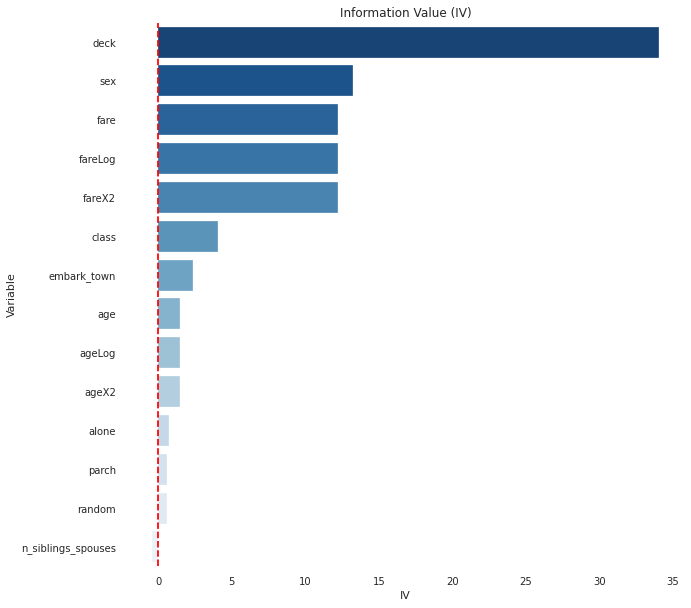

In [13]:
fig = plt.figure(figsize=(10,10))
sns.barplot(y="Variable", x="IV", data=result_formated_graph.head(40), palette="Blues_r").set_title("Information Value (IV)")
plt.axvline (x=0.02, linestyle="--", color='r')

## 5.2 Charts with the good rate (% of target = 1) by categories or by value range for numeric variables (ranges created by decile)

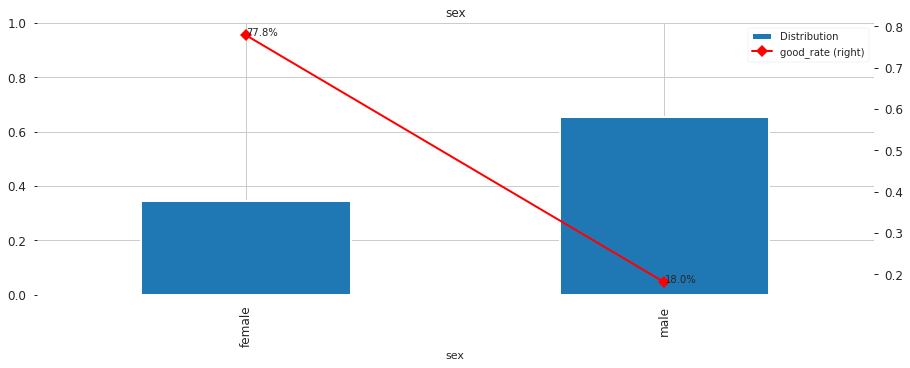

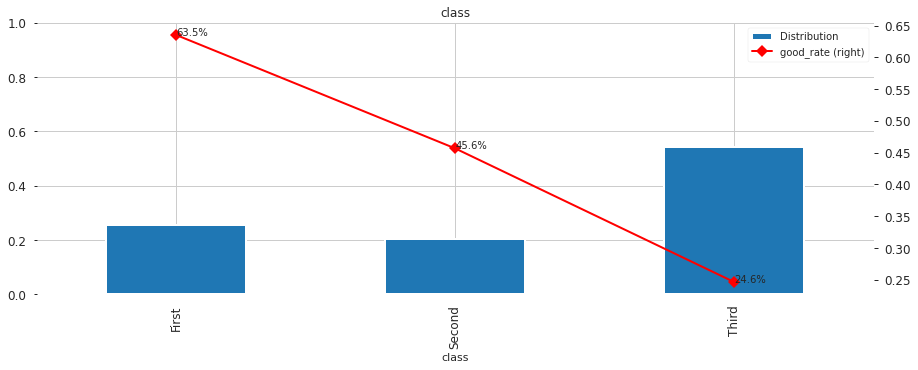

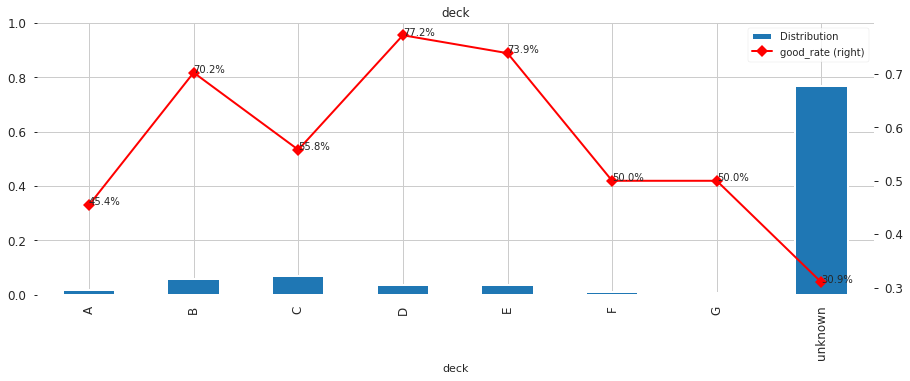

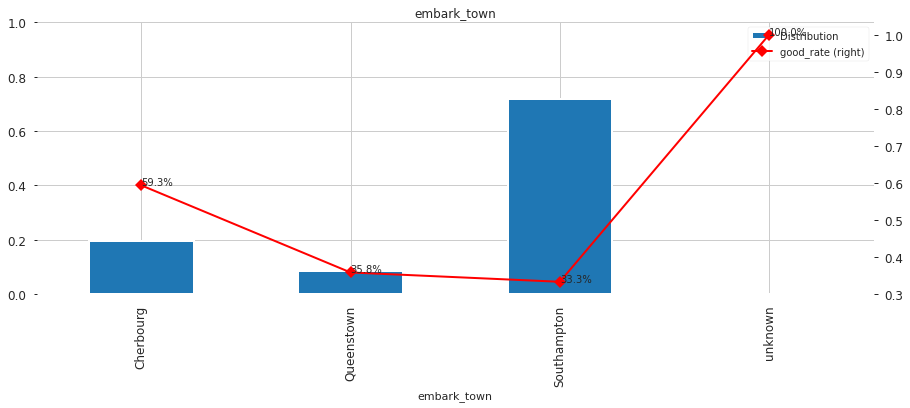

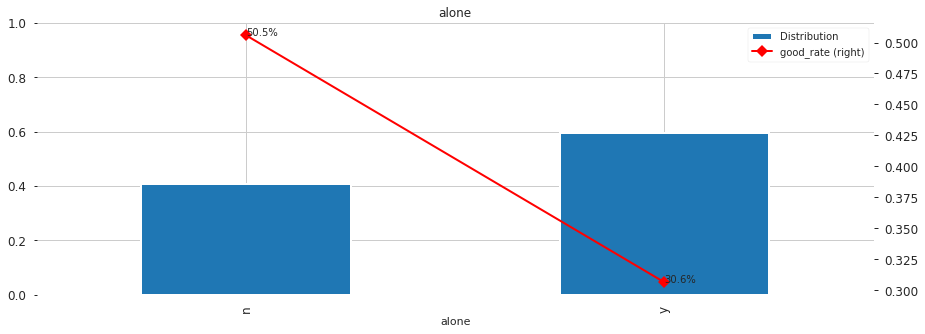

...

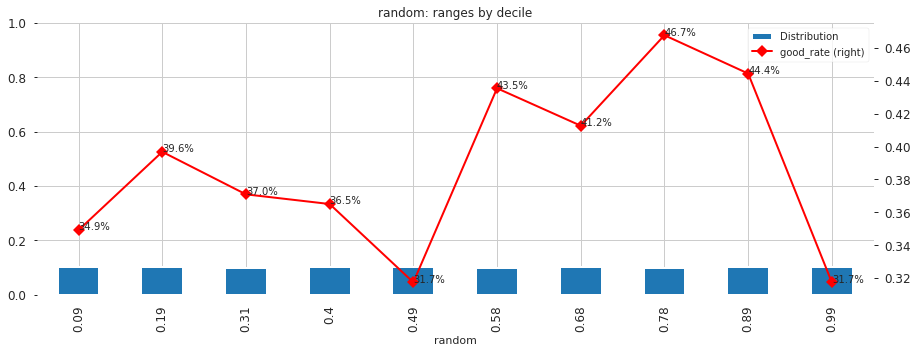

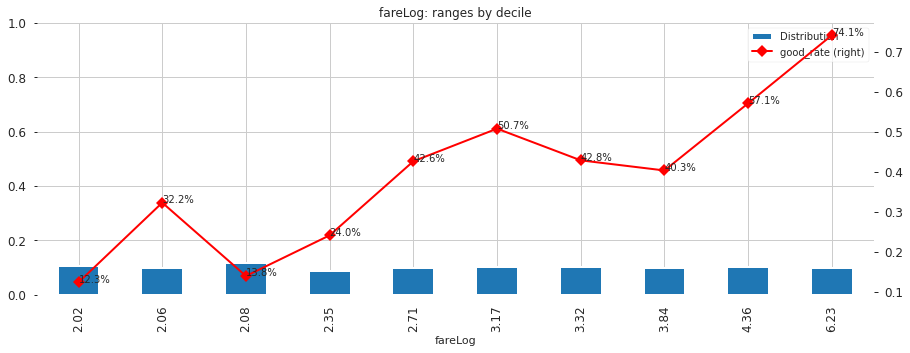

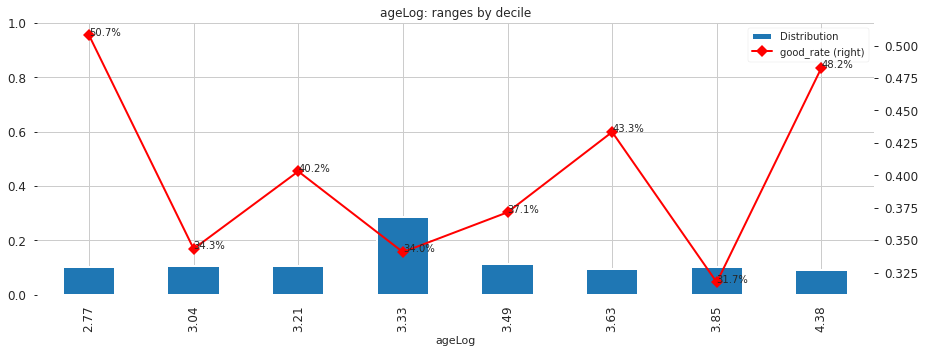

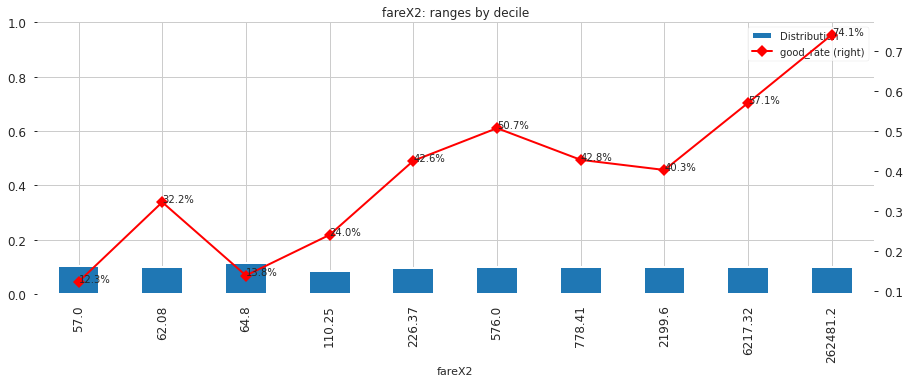

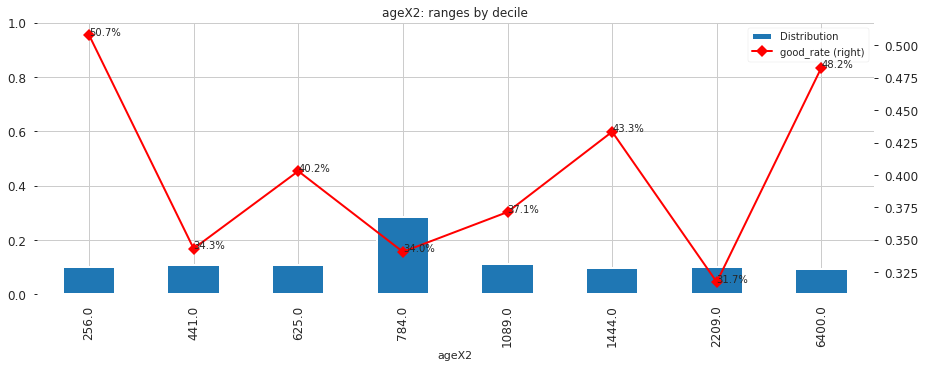

In [14]:
for i in selected_features:
    df_plot_tmp = result_data[i][1]
    df_plot_tmp['Distribution'] = df_plot_tmp.qty / df_plot_tmp.qty.sum()
    if i in CAT:
#         print('--------------------------------------- ' + str(i))
        df_plot_tmp = df_plot_tmp.sort_values(by=i)
        df_plot_t1 = df_plot_tmp.loc[:, (i,'Distribution')]
        df_plot_t1 = df_plot_t1.set_index(i)
        df_plot_t2 = df_plot_tmp.loc[:, (i, 'good_rate')]
        df_plot_t2 = df_plot_t2.set_index(i)
        df_plot_t1.Distribution.plot(ylim=[0,1], kind='bar', rot=90, figsize=(15,5), linewidth=2, fontsize=12, grid=True, legend=1, title=i)
        ax = df_plot_t2.good_rate.plot(secondary_y=True, kind="line", rot=90, figsize=(15,5), linewidth=2, fontsize=12\
                                       , marker="D", ms=8, grid=True, color='r', legend=1)
        for p in range(len(df_plot_t2)):
            ax.annotate(str('{0:.1%}'.format(int(df_plot_t2.reset_index().iloc[p,1]*1000)/1000))\
                            ,(df_plot_t2.reset_index().index.values[p]\
                              ,df_plot_t2.reset_index().iloc[p,1]*1))
        plt.show()
        #display(ax)
    else:
        sort_var = str(i)+"_max"
#         print('--------------------------------------- ' + str(i))
        df_plot_tmp[sort_var] = df_plot_tmp[sort_var].astype(float)
        df_plot_tmp = df_plot_tmp.sort_values(by=sort_var)
        df_plot_tmp[i] = df_plot_tmp[sort_var].fillna(999999999.99).astype(float)
        df_plot_tmp[i] = (df_plot_tmp[i]*100).astype(int)/100
        df_plot_tmp[i] = df_plot_tmp[i].astype(str).replace("999999999.99", "missing")
        df_plot_t1 = df_plot_tmp.loc[:, (i, 'Distribution')]
        df_plot_t1 = df_plot_t1.set_index(i)
        df_plot_t2 = df_plot_tmp.loc[:, (i, 'good_rate')]
        df_plot_t2 = df_plot_t2.set_index(i)
        df_plot_t1.Distribution.plot(ylim=[0,1], kind='bar', rot=90, figsize=(15,5), linewidth=2, fontsize=12, grid=True, legend=1, title=(i + ": ranges by decile"))
        ax = df_plot_t2.good_rate.plot(secondary_y=True, kind="line", rot=90, figsize=(15,5), linewidth=2, fontsize=12, marker="D", ms=8, grid=True, color='r', legend=1)
        for p in range(len(df_plot_t2)):
            ax.annotate(str('{0:.1%}'.format(int(df_plot_t2.reset_index().iloc[p,1]*1000)/1000)), (df_plot_t2.reset_index().index.values[p], df_plot_t2.reset_index().iloc[p,1]*1))        
        plt.show()
        #display(ax)

# 6. Modeling

## 6.1 Creating context and H2O and Importing data into the H2O context

In [15]:
# Number of threads, nthreads = -1, means use all cores on your machine
# max_mem_size is the maximum memory (in GB) to allocate to H2O
h2o.init(nthreads = -1, max_mem_size = 8)

Checking whether there is an H2O instance running at http://localhost:54321 ..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.10" 2021-01-19; OpenJDK Runtime Environment (build 11.0.10+9-Ubuntu-0ubuntu1.18.04); OpenJDK 64-Bit Server VM (build 11.0.10+9-Ubuntu-0ubuntu1.18.04, mixed mode, sharing)
  Starting server from /opt/conda/lib/python3.7/site-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmp4apyj2mx
  JVM stdout: /tmp/tmp4apyj2mx/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmp4apyj2mx/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O_cluster_uptime:,02 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.32.0.4
H2O_cluster_version_age:,1 month and 20 days
H2O_cluster_name:,H2O_from_python_unknownUser_9n64zo
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,8 Gb
H2O_cluster_total_cores:,4
H2O_cluster_allowed_cores:,4
H2O_cluster_status:,"accepting new members, healthy"


In [16]:
#Import TRAINING base to the H20 context
data_hdf = h2o.H2OFrame(dataprep_df.query('dataset == "train"'))

# Conversion of Target variables and categorical features to factor (enum)
#no H2O it is necessary that the categorical variables are transformed into a factor
data_hdf[var_target] = data_hdf[var_target].asfactor()
for col_name in CAT:
    data_hdf[col_name] = data_hdf[col_name].asfactor()    
    
# Partition data into 90%, 10% chunks
# Setting a seed will guarantee reproducibility
train_hdf, valid_hdf = data_hdf.split_frame(ratios=[0.90], destination_frames=['train_hdf', 'valid_hdf'], seed=1)
        
#Notice that `split_frame()` uses approximate splitting not exact splitting (for efficiency), so these are not exactly 90%, 10% of the total rows.
print('Training: ' + str(train_hdf.nrow))
print('Validation: ' + str(valid_hdf.nrow))

Parse progress: |█████████████████████████████████████████████████████████| 100%
Training: 489
Validation: 54


In [17]:
#Import TEST base to the H20 context
test_hdf = h2o.H2OFrame(dataprep_df.query('dataset == "test"'))

# Conversion of Target variables and categorical features to factor (enum)
#no H2O it is necessary that the categorical variables are transformed into a factor
test_hdf[var_target] = test_hdf[var_target].asfactor()
for col_name in CAT:
    test_hdf[col_name] = test_hdf[col_name].asfactor()    
    
print('Training: ' + str(test_hdf.nrow))

Parse progress: |█████████████████████████████████████████████████████████| 100%
Training: 84


## 6.2 Using H2O to performe many ML algorithms

## Logistic Regresion (GLM)

In [18]:
vModel = 'GLM_'

start = dt.datetime.now()
from h2o.estimators.glm import H2OGeneralizedLinearEstimator

#definir parámetros
GLM = H2OGeneralizedLinearEstimator(family= 'binomial',
                                    seed=1,
                                    model_id='%s%s%s' % (vModel, ModelId, str(dt.datetime.now())[:19].replace('-',"").replace(':',"").replace(' ',"_")))

#Executar Modelo
GLM.train(x = selected_features,
          y = var_target,
          training_frame = train_hdf,
          validation_frame = valid_hdf)

#Execution time of the model
stop = dt.datetime.now()
execution_time = stop-start
print("\n"+ "Execution time: " + str(execution_time) +"\n")
print(GLM)

glm Model Build progress: |███████████████████████████████████████████████| 100%

Execution time: 0:00:00.715777

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_Titanic_FML_v120210321_205947


GLM Model: summary


,,family,link,regularization,number_of_predictors_total,number_of_active_predictors,number_of_iterations,training_frame
0,,binomial,logit,"Elastic Net (alpha = 0.5, lambda = 3.4E-4 )",28,25,4,train_hdf




ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.12320877208351162
RMSE: 0.35101107116943137
LogLoss: 0.39415183863789216
Null degrees of freedom: 488
Residual degrees of freedom: 463
Null deviance: 656.8860887493607
Residual deviance: 385.4804981878586
AIC: 437.4804981878586
AUC: 0.8895684081775291
AUCPR: 0.8760698977433677
Gini: 0.7791368163550583

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5553921907128907: 


,,0,1,Error,Rate
0,0,265.0,30.0,0.1017,(30.0/295.0)
1,1,47.0,147.0,0.2423,(47.0/194.0)
2,Total,312.0,177.0,0.1575,(77.0/489.0)



Maximum Metrics: Maximum metrics at their respective thresholds


,metric,threshold,value,idx
0,max f1,0.555392,0.792453,161.0
1,max f2,0.206883,0.822846,238.0
2,max f0point5,0.662238,0.835476,131.0
3,max accuracy,0.614252,0.846626,145.0
4,max precision,0.993405,1.000000,0.0
5,max recall,0.049891,1.000000,388.0
6,max specificity,0.993405,1.000000,0.0
7,max absolute_mcc,0.614252,0.677150,145.0
8,max min_per_class_accuracy,0.372326,0.809278,195.0
9,max mean_per_class_accuracy,0.555392,0.828019,161.0



Gains/Lift Table: Avg response rate: 39.67 %, avg score: 39.67 %


,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain,kolmogorov_smirnov
0,1,0.010225,0.984697,2.520619,2.520619,1.000000,0.990372,1.000000,0.990372,0.025773,0.025773,152.061856,152.061856,0.025773
1,2,0.020450,0.979404,2.520619,2.520619,1.000000,0.983103,1.000000,0.986738,0.025773,0.051546,152.061856,152.061856,0.051546
2,3,0.030675,0.976383,2.520619,2.520619,1.000000,0.978084,1.000000,0.983853,0.025773,0.077320,152.061856,152.061856,0.077320
3,4,0.040900,0.970425,2.520619,2.520619,1.000000,0.973663,1.000000,0.981305,0.025773,0.103093,152.061856,152.061856,0.103093
4,5,0.051125,0.964590,2.520619,2.520619,1.000000,0.967960,1.000000,0.978636,0.025773,0.128866,152.061856,152.061856,0.128866
5,6,0.100204,0.934550,2.520619,2.520619,1.000000,0.953307,1.000000,0.966230,0.123711,0.252577,152.061856,152.061856,0.252577
6,7,0.151329,0.866459,2.419794,2.486556,0.960000,0.908726,0.986486,0.946803,0.123711,0.376289,141.979381,148.655614,0.372899
7,8,0.200409,0.794061,2.100515,2.392016,0.833333,0.829708,0.948980,0.918127,0.103093,0.479381,110.051546,139.201557,0.462432
8,9,0.300613,0.661015,1.903324,2.229118,0.755102,0.722410,0.884354,0.852888,0.190722,0.670103,90.332422,122.911845,0.612476
9,10,0.400818,0.436126,1.183147,1.967626,0.469388,0.566904,0.780612,0.781392,0.118557,0.788660,18.314749,96.762571,0.642897




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.1528063933712927
RMSE: 0.3909045834616073
LogLoss: 0.5085765103116431
Null degrees of freedom: 53
Residual degrees of freedom: 28
Null deviance: 70.50826387509233
Residual deviance: 54.92626311365745
AIC: 106.92626311365746
AUC: 0.8345864661654135
AUCPR: 0.6778015102872665
Gini: 0.6691729323308271

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.2141320711335884: 


,,0,1,Error,Rate
0,0,26.0,9.0,0.2571,(9.0/35.0)
1,1,2.0,17.0,0.1053,(2.0/19.0)
2,Total,28.0,26.0,0.2037,(11.0/54.0)



Maximum Metrics: Maximum metrics at their respective thresholds


,metric,threshold,value,idx
0,max f1,0.214132,0.755556,25.0
1,max f2,0.214132,0.833333,25.0
2,max f0point5,0.771579,0.746269,11.0
3,max accuracy,0.552494,0.814815,20.0
4,max precision,0.892288,0.875000,7.0
5,max recall,0.064908,1.000000,47.0
6,max specificity,0.992171,0.971429,0.0
7,max absolute_mcc,0.214132,0.609382,25.0
8,max min_per_class_accuracy,0.552494,0.789474,20.0
9,max mean_per_class_accuracy,0.214132,0.818797,25.0



Gains/Lift Table: Avg response rate: 35.19 %, avg score: 37.87 %


,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain,kolmogorov_smirnov
0,1,0.018519,0.975953,0.000000,0.000000,0.000000,0.992171,0.000000,0.992171,0.000000,0.000000,-100.000000,-100.000000,-0.028571
1,2,0.037037,0.961205,2.842105,1.421053,1.000000,0.961570,0.500000,0.976871,0.052632,0.052632,184.210526,42.105263,0.024060
2,3,0.037037,0.957985,0.000000,1.421053,0.000000,0.000000,0.500000,0.976871,0.000000,0.052632,-100.000000,42.105263,0.024060
3,4,0.055556,0.955359,2.842105,1.894737,1.000000,0.955494,0.666667,0.969745,0.052632,0.105263,184.210526,89.473684,0.076692
4,5,0.055556,0.954764,0.000000,1.894737,0.000000,0.000000,0.666667,0.969745,0.000000,0.105263,-100.000000,89.473684,0.076692
5,6,0.111111,0.915126,2.842105,2.368421,1.000000,0.930868,0.833333,0.950307,0.157895,0.263158,184.210526,136.842105,0.234586
6,7,0.148148,0.882748,2.842105,2.486842,1.000000,0.902561,0.875000,0.938370,0.105263,0.368421,184.210526,148.684211,0.339850
7,8,0.203704,0.784604,1.894737,2.325359,0.666667,0.837986,0.818182,0.910993,0.105263,0.473684,89.473684,132.535885,0.416541
8,9,0.296296,0.624061,1.136842,1.953947,0.400000,0.709178,0.687500,0.847926,0.105263,0.578947,13.684211,95.394737,0.436090
9,10,0.407407,0.475129,1.894737,1.937799,0.666667,0.569801,0.681818,0.772074,0.210526,0.789474,89.473684,93.779904,0.589474




Scoring History: 


,,timestamp,duration,iterations,negative_log_likelihood,objective,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
0,,2021-03-21 20:59:47,0.000 sec,0,328.443044,0.671663,0.351011,0.394152,0.485203,0.889568,0.87607,2.520619,0.157464,0.390905,0.508577,0.32995,0.834586,0.677802,0.0,0.203704
1,,2021-03-21 20:59:47,0.047 sec,1,203.917420,0.418579,,,,,,,,,,,,,,
2,,2021-03-21 20:59:47,0.058 sec,2,193.633870,0.398456,,,,,,,,,,,,,,
3,,2021-03-21 20:59:47,0.069 sec,3,192.749767,0.396983,,,,,,,,,,,,,,
4,,2021-03-21 20:59:48,0.077 sec,4,192.740249,0.396983,,,,,,,,,,,,,,



Variable Importances: 


,variable,relative_importance,scaled_importance,percentage
0,sex.male,1.556967,1.000000,0.133593
1,sex.female,1.489609,0.956737,0.127813
2,deck.E,1.203401,0.772913,0.103256
3,deck.C,0.877443,0.563559,0.075287
4,class.First,0.729675,0.468651,0.062608
5,n_siblings_spouses,0.715737,0.459699,0.061412
6,ageLog,0.701518,0.450567,0.060192
7,class.Third,0.685857,0.440508,0.058849
8,deck.G,0.491489,0.315671,0.042171
9,deck.unknown,0.452400,0.290565,0.038817



See the whole table with table.as_data_frame()



## GBM - Gradient Boosting Machine

In [19]:
vModel='GBM_'

#Execution time of the model
start = dt.datetime.now()

from h2o.estimators.gbm import H2OGradientBoostingEstimator
GBM = H2OGradientBoostingEstimator(model_id='%s%s%s' % (vModel, ModelId, str(dt.datetime.now())[:19].replace('-',"").replace(':',"").replace(' ',"_")),
                                   ntrees=500,
                                   score_tree_interval=5,     #used for early stopping
                                   stopping_rounds=3,         #used for early stopping
                                   stopping_metric='AUCPR',     #used for early stopping
                                   stopping_tolerance=0.0005, #used for early stopping
                                   seed=1)

# The use of a validation_frame is recommended with using early stopping
GBM.train(x=selected_features, y=var_target, training_frame=train_hdf, validation_frame=valid_hdf)

#Execution time of the model
stop = dt.datetime.now()
execution_time = stop-start
print("\n"+ "Execution time: " + str(execution_time) + "\n")
print(GBM)

gbm Model Build progress: |███████████████████████████████████████████████| 100%

Execution time: 0:00:01.472017

Model Details
H2OGradientBoostingEstimator :  Gradient Boosting Machine
Model Key:  GBM_Titanic_FML_v120210321_205948


Model Summary: 


,,number_of_trees,number_of_internal_trees,model_size_in_bytes,min_depth,max_depth,mean_depth,min_leaves,max_leaves,mean_leaves
0,,30.0,30.0,8174.0,5.0,5.0,5.0,11.0,22.0,17.033333




ModelMetricsBinomial: gbm
** Reported on train data. **

MSE: 0.0794687868850184
RMSE: 0.2819020874080545
LogLoss: 0.27754146613110386
Mean Per-Class Error: 0.10871046653852878
AUC: 0.9660143281495719
AUCPR: 0.9558631369324202
Gini: 0.9320286562991438

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4701026691896528: 


,,0,1,Error,Rate
0,0,278.0,17.0,0.0576,(17.0/295.0)
1,1,31.0,163.0,0.1598,(31.0/194.0)
2,Total,309.0,180.0,0.0982,(48.0/489.0)



Maximum Metrics: Maximum metrics at their respective thresholds


,metric,threshold,value,idx
0,max f1,0.470103,0.871658,161.0
1,max f2,0.226793,0.915287,228.0
2,max f0point5,0.707088,0.916442,120.0
3,max accuracy,0.500191,0.901840,150.0
4,max precision,0.971860,1.000000,0.0
5,max recall,0.116561,1.000000,302.0
6,max specificity,0.971860,1.000000,0.0
7,max absolute_mcc,0.500191,0.795274,150.0
8,max min_per_class_accuracy,0.343559,0.876289,186.0
9,max mean_per_class_accuracy,0.470103,0.891290,161.0



Gains/Lift Table: Avg response rate: 39.67 %, avg score: 39.70 %


,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain,kolmogorov_smirnov
0,1,0.010225,0.963027,2.520619,2.520619,1.000000,0.967356,1.000000,0.967356,0.025773,0.025773,152.061856,152.061856,0.025773
1,2,0.020450,0.957987,2.520619,2.520619,1.000000,0.960771,1.000000,0.964064,0.025773,0.051546,152.061856,152.061856,0.051546
2,3,0.030675,0.951690,2.520619,2.520619,1.000000,0.954415,1.000000,0.960847,0.025773,0.077320,152.061856,152.061856,0.077320
3,4,0.040900,0.948804,2.520619,2.520619,1.000000,0.949944,1.000000,0.958122,0.025773,0.103093,152.061856,152.061856,0.103093
4,5,0.051125,0.947234,2.520619,2.520619,1.000000,0.948223,1.000000,0.956142,0.025773,0.128866,152.061856,152.061856,0.128866
5,6,0.100204,0.934650,2.520619,2.520619,1.000000,0.941079,1.000000,0.948764,0.123711,0.252577,152.061856,152.061856,0.252577
6,7,0.151329,0.904539,2.520619,2.520619,1.000000,0.921686,1.000000,0.939616,0.128866,0.381443,152.061856,152.061856,0.381443
7,8,0.200409,0.834958,2.520619,2.520619,1.000000,0.870965,1.000000,0.922804,0.123711,0.505155,152.061856,152.061856,0.505155
8,9,0.300613,0.618384,2.211971,2.417736,0.877551,0.753278,0.959184,0.866295,0.221649,0.726804,121.197139,141.773617,0.706465
9,10,0.400818,0.386294,1.234589,2.121949,0.489796,0.496767,0.841837,0.773913,0.123711,0.850515,23.458868,112.194930,0.745431




ModelMetricsBinomial: gbm
** Reported on validation data. **

MSE: 0.14674816083095735
RMSE: 0.38307722567513375
LogLoss: 0.48397888358475405
Mean Per-Class Error: 0.1383458646616541
AUC: 0.8360902255639098
AUCPR: 0.6685972459855464
Gini: 0.6721804511278195

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.34522997791363946: 


,,0,1,Error,Rate
0,0,29.0,6.0,0.1714,(6.0/35.0)
1,1,2.0,17.0,0.1053,(2.0/19.0)
2,Total,31.0,23.0,0.1481,(8.0/54.0)



Maximum Metrics: Maximum metrics at their respective thresholds


,metric,threshold,value,idx
0,max f1,0.345230,0.809524,22.0
1,max f2,0.345230,0.858586,22.0
2,max f0point5,0.345230,0.765766,22.0
3,max accuracy,0.345230,0.851852,22.0
4,max precision,0.928206,0.800000,4.0
5,max recall,0.054554,1.000000,50.0
6,max specificity,0.963137,0.971429,0.0
7,max absolute_mcc,0.345230,0.698537,22.0
8,max min_per_class_accuracy,0.439619,0.828571,21.0
9,max mean_per_class_accuracy,0.345230,0.861654,22.0



Gains/Lift Table: Avg response rate: 35.19 %, avg score: 38.94 %


,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain,kolmogorov_smirnov
0,1,0.018519,0.952435,0.000000,0.000000,0.000000,0.963137,0.000000,0.963137,0.000000,0.000000,-100.000000,-100.000000,-0.028571
1,2,0.037037,0.942427,2.842105,1.421053,1.000000,0.942944,0.500000,0.953040,0.052632,0.052632,184.210526,42.105263,0.024060
2,3,0.037037,0.937860,0.000000,1.421053,0.000000,0.000000,0.500000,0.953040,0.000000,0.052632,-100.000000,42.105263,0.024060
3,4,0.055556,0.933969,2.842105,1.894737,1.000000,0.934327,0.666667,0.946803,0.052632,0.105263,184.210526,89.473684,0.076692
4,5,0.055556,0.932387,0.000000,1.894737,0.000000,0.000000,0.666667,0.946803,0.000000,0.105263,-100.000000,89.473684,0.076692
5,6,0.111111,0.922725,1.894737,1.894737,0.666667,0.927462,0.666667,0.937132,0.105263,0.210526,89.473684,89.473684,0.153383
6,7,0.148148,0.884233,2.842105,2.131579,1.000000,0.912767,0.750000,0.931041,0.105263,0.315789,184.210526,113.157895,0.258647
7,8,0.203704,0.838407,1.894737,2.066986,0.666667,0.869119,0.727273,0.914153,0.105263,0.421053,89.473684,106.698565,0.335338
8,9,0.296296,0.577872,1.705263,1.953947,0.600000,0.688591,0.687500,0.843665,0.157895,0.578947,70.526316,95.394737,0.436090
9,10,0.407407,0.420741,2.368421,2.066986,0.833333,0.495941,0.727273,0.748831,0.263158,0.842105,136.842105,106.698565,0.670677




Scoring History: 


,,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
0,,2021-03-21 20:59:48,0.031 sec,0.0,0.489219,0.671663,0.500000,0.396728,1.000000,0.603272,0.479652,0.652854,0.500000,0.351852,1.000000,0.648148
1,,2021-03-21 20:59:49,0.398 sec,5.0,0.391325,0.489120,0.928726,0.916164,2.520619,0.137014,0.408818,0.518205,0.860902,0.754501,2.368421,0.185185
2,,2021-03-21 20:59:49,0.543 sec,10.0,0.345216,0.404722,0.939734,0.924907,2.520619,0.130879,0.387237,0.473116,0.848120,0.774451,2.842105,0.185185
3,,2021-03-21 20:59:49,0.686 sec,15.0,0.320067,0.353804,0.947108,0.932422,2.520619,0.118609,0.385938,0.466271,0.841353,0.774303,2.842105,0.185185
4,,2021-03-21 20:59:49,0.785 sec,20.0,0.303431,0.319802,0.952761,0.940577,2.520619,0.114519,0.384405,0.464226,0.849624,0.752646,2.842105,0.185185
5,,2021-03-21 20:59:49,0.896 sec,25.0,0.290996,0.294664,0.960764,0.949151,2.520619,0.118609,0.383317,0.474348,0.843609,0.679854,0.000000,0.148148
6,,2021-03-21 20:59:49,1.025 sec,30.0,0.281902,0.277541,0.966014,0.955863,2.520619,0.098160,0.383077,0.483979,0.836090,0.668597,0.000000,0.148148



Variable Importances: 


,variable,relative_importance,scaled_importance,percentage
0,sex,221.984772,1.000000,0.542123
1,random,37.393517,0.168451,0.091321
2,class,33.858440,0.152526,0.082688
3,fareLog,29.208544,0.131579,0.071332
4,deck,28.335924,0.127648,0.069201
5,age,18.368160,0.082745,0.044858
6,fare,11.231046,0.050594,0.027428
7,ageX2,8.405372,0.037865,0.020527
8,ageLog,6.431081,0.028971,0.015706
9,alone,3.773199,0.016998,0.009215


## GBM - Gradient Boosting Machine with Cross-Validation

In [20]:
vModel='GBM_cv_'

#Execution time of the model
start = dt.datetime.now()

from h2o.estimators.gbm import H2OGradientBoostingEstimator
GBM_cv = H2OGradientBoostingEstimator(model_id='%s%s%s' % (vModel, ModelId, str(dt.datetime.now())[:19].replace('-',"").replace(':',"").replace(' ',"_"))
                                   ,nfolds=5
                                   ,seed=1)

# The use of a validation_frame is recommended with using early stopping
GBM_cv.train(x=selected_features, y=var_target, training_frame=train_hdf, validation_frame=valid_hdf)

#Execution time of the model
stop = dt.datetime.now()
execution_time = stop-start
print("\n"+ "Execution time: " + str(execution_time) + "\n")
print(GBM_cv)

gbm Model Build progress: |███████████████████████████████████████████████| 100%

Execution time: 0:00:06.416688

Model Details
H2OGradientBoostingEstimator :  Gradient Boosting Machine
Model Key:  GBM_cv_Titanic_FML_v120210321_205950


Model Summary: 


,,number_of_trees,number_of_internal_trees,model_size_in_bytes,min_depth,max_depth,mean_depth,min_leaves,max_leaves,mean_leaves
0,,50.0,50.0,12553.0,5.0,5.0,5.0,6.0,22.0,15.34




ModelMetricsBinomial: gbm
** Reported on train data. **

MSE: 0.06197833177234468
RMSE: 0.2489544773092958
LogLoss: 0.22515119365816966
Mean Per-Class Error: 0.08456229250393155
AUC: 0.9797047003319936
AUCPR: 0.9732435263261189
Gini: 0.9594094006639873

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4766491950559126: 


,,0,1,Error,Rate
0,0,284.0,11.0,0.0373,(11.0/295.0)
1,1,26.0,168.0,0.134,(26.0/194.0)
2,Total,310.0,179.0,0.0757,(37.0/489.0)



Maximum Metrics: Maximum metrics at their respective thresholds


,metric,threshold,value,idx
0,max f1,0.476649,0.900804,157.0
1,max f2,0.266216,0.933794,211.0
2,max f0point5,0.561864,0.936768,144.0
3,max accuracy,0.500656,0.924335,153.0
4,max precision,0.989883,1.000000,0.0
5,max recall,0.107041,1.000000,278.0
6,max specificity,0.989883,1.000000,0.0
7,max absolute_mcc,0.500656,0.842107,153.0
8,max min_per_class_accuracy,0.384723,0.905085,181.0
9,max mean_per_class_accuracy,0.400889,0.915438,174.0



Gains/Lift Table: Avg response rate: 39.67 %, avg score: 39.70 %


,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain,kolmogorov_smirnov
0,1,0.010225,0.983439,2.520619,2.520619,1.000000,0.987785,1.000000,0.987785,0.025773,0.025773,152.061856,152.061856,0.025773
1,2,0.020450,0.981365,2.520619,2.520619,1.000000,0.982519,1.000000,0.985152,0.025773,0.051546,152.061856,152.061856,0.051546
2,3,0.030675,0.979535,2.520619,2.520619,1.000000,0.980742,1.000000,0.983682,0.025773,0.077320,152.061856,152.061856,0.077320
3,4,0.040900,0.973105,2.520619,2.520619,1.000000,0.976299,1.000000,0.981836,0.025773,0.103093,152.061856,152.061856,0.103093
4,5,0.051125,0.969207,2.520619,2.520619,1.000000,0.971374,1.000000,0.979744,0.025773,0.128866,152.061856,152.061856,0.128866
5,6,0.100204,0.954465,2.520619,2.520619,1.000000,0.962867,1.000000,0.971477,0.123711,0.252577,152.061856,152.061856,0.252577
6,7,0.151329,0.929420,2.520619,2.520619,1.000000,0.941735,1.000000,0.961429,0.128866,0.381443,152.061856,152.061856,0.381443
7,8,0.200409,0.879179,2.520619,2.520619,1.000000,0.902978,1.000000,0.947115,0.123711,0.505155,152.061856,152.061856,0.505155
8,9,0.300613,0.656344,2.469177,2.503471,0.979592,0.794473,0.993197,0.896234,0.247423,0.752577,146.917736,150.347149,0.749187
9,10,0.400818,0.400806,1.491795,2.250552,0.591837,0.519338,0.892857,0.802010,0.149485,0.902062,49.179466,125.055228,0.830875




ModelMetricsBinomial: gbm
** Reported on validation data. **

MSE: 0.14841709317571117
RMSE: 0.38524939088298527
LogLoss: 0.5198618622224976
Mean Per-Class Error: 0.15263157894736845
AUC: 0.8270676691729323
AUCPR: 0.6549049245276184
Gini: 0.6541353383458646

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.2676502353832092: 


,,0,1,Error,Rate
0,0,28.0,7.0,0.2,(7.0/35.0)
1,1,2.0,17.0,0.1053,(2.0/19.0)
2,Total,30.0,24.0,0.1667,(9.0/54.0)



Maximum Metrics: Maximum metrics at their respective thresholds


,metric,threshold,value,idx
0,max f1,0.267650,0.790698,23.0
1,max f2,0.267650,0.850000,23.0
2,max f0point5,0.422861,0.747664,21.0
3,max accuracy,0.422861,0.833333,21.0
4,max precision,0.948833,0.800000,4.0
5,max recall,0.028952,1.000000,49.0
6,max specificity,0.989381,0.971429,0.0
7,max absolute_mcc,0.267650,0.667675,23.0
8,max min_per_class_accuracy,0.422861,0.828571,21.0
9,max mean_per_class_accuracy,0.267650,0.847368,23.0



Gains/Lift Table: Avg response rate: 35.19 %, avg score: 38.55 %


,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain,kolmogorov_smirnov
0,1,0.018519,0.975686,0.000000,0.000000,0.000000,0.989381,0.000000,0.989381,0.000000,0.000000,-100.000000,-100.000000,-0.028571
1,2,0.037037,0.963373,2.842105,1.421053,1.000000,0.963541,0.500000,0.976461,0.052632,0.052632,184.210526,42.105263,0.024060
2,3,0.037037,0.961884,0.000000,1.421053,0.000000,0.000000,0.500000,0.976461,0.000000,0.052632,-100.000000,42.105263,0.024060
3,4,0.055556,0.960046,2.842105,1.894737,1.000000,0.960732,0.666667,0.971218,0.052632,0.105263,184.210526,89.473684,0.076692
4,5,0.055556,0.957015,0.000000,1.894737,0.000000,0.000000,0.666667,0.971218,0.000000,0.105263,-100.000000,89.473684,0.076692
5,6,0.111111,0.937957,1.894737,1.894737,0.666667,0.947427,0.666667,0.959322,0.105263,0.210526,89.473684,89.473684,0.153383
6,7,0.148148,0.911239,2.842105,2.131579,1.000000,0.935410,0.750000,0.953344,0.105263,0.315789,184.210526,113.157895,0.258647
7,8,0.203704,0.821842,1.894737,2.066986,0.666667,0.881123,0.727273,0.933648,0.105263,0.421053,89.473684,106.698565,0.335338
8,9,0.296296,0.621028,1.705263,1.953947,0.600000,0.719915,0.687500,0.866856,0.157895,0.578947,70.526316,95.394737,0.436090
9,10,0.407407,0.395550,2.368421,2.066986,0.833333,0.544677,0.727273,0.778989,0.263158,0.842105,136.842105,106.698565,0.670677




ModelMetricsBinomial: gbm
** Reported on cross-validation data. **

MSE: 0.15179825282891973
RMSE: 0.3896129525938784
LogLoss: 0.484388714122631
Mean Per-Class Error: 0.2178402935523327
AUC: 0.8358553206360301
AUCPR: 0.821382803415622
Gini: 0.6717106412720601

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.673347830758294: 


,,0,1,Error,Rate
0,0,279.0,16.0,0.0542,(16.0/295.0)
1,1,74.0,120.0,0.3814,(74.0/194.0)
2,Total,353.0,136.0,0.184,(90.0/489.0)



Maximum Metrics: Maximum metrics at their respective thresholds


,metric,threshold,value,idx
0,max f1,0.673348,0.727273,114.0
1,max f2,0.120125,0.794307,276.0
2,max f0point5,0.673348,0.813008,114.0
3,max accuracy,0.673348,0.815951,114.0
4,max precision,0.987219,1.000000,0.0
5,max recall,0.018118,1.000000,398.0
6,max specificity,0.987219,1.000000,0.0
7,max absolute_mcc,0.673348,0.616141,114.0
8,max min_per_class_accuracy,0.350827,0.747423,189.0
9,max mean_per_class_accuracy,0.673348,0.782160,114.0



Gains/Lift Table: Avg response rate: 39.67 %, avg score: 39.50 %


,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain,kolmogorov_smirnov
0,1,0.010225,0.982604,2.520619,2.520619,1.000000,0.984736,1.000000,0.984736,0.025773,0.025773,152.061856,152.061856,0.025773
1,2,0.020450,0.980167,2.520619,2.520619,1.000000,0.981509,1.000000,0.983123,0.025773,0.051546,152.061856,152.061856,0.051546
2,3,0.030675,0.977928,2.520619,2.520619,1.000000,0.979533,1.000000,0.981926,0.025773,0.077320,152.061856,152.061856,0.077320
3,4,0.040900,0.973588,2.520619,2.520619,1.000000,0.976198,1.000000,0.980494,0.025773,0.103093,152.061856,152.061856,0.103093
4,5,0.051125,0.972338,2.520619,2.520619,1.000000,0.973000,1.000000,0.978995,0.025773,0.128866,152.061856,152.061856,0.128866
5,6,0.100204,0.954383,2.310567,2.417736,0.916667,0.964398,0.959184,0.971846,0.113402,0.242268,131.056701,141.773617,0.235488
6,7,0.151329,0.930012,2.218144,2.350306,0.880000,0.944065,0.932432,0.962460,0.113402,0.355670,121.814433,135.030649,0.338721
7,8,0.200409,0.876581,2.205541,2.314854,0.875000,0.903734,0.918367,0.948078,0.108247,0.463918,120.554124,131.485378,0.436799
8,9,0.300613,0.599343,1.697559,2.109089,0.673469,0.745213,0.836735,0.880457,0.170103,0.634021,69.755944,110.908900,0.552665
9,10,0.400818,0.396499,0.874500,1.800442,0.346939,0.503351,0.714286,0.786180,0.087629,0.721649,-12.549968,80.044183,0.531819




Cross-Validation Metrics Summary: 


,,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
0,accuracy,0.8127282,0.040535636,0.87,0.82568806,0.814433,0.79310346,0.7604167
1,auc,0.836556,0.026803823,0.8421978,0.8174771,0.8070558,0.83950615,0.8765432
2,aucpr,0.82675457,0.027762597,0.834971,0.8103911,0.80313814,0.8136056,0.87166715
3,err,0.18727176,0.040535636,0.13,0.17431192,0.185567,0.20689656,0.23958333
4,err_count,18.2,3.563706,13.0,19.0,18.0,18.0,23.0
5,f0point5,0.7870309,0.07525738,0.8778626,0.82822084,0.80924857,0.72254336,0.6972789
6,f1,0.75847805,0.021482024,0.779661,0.739726,0.7567568,0.7352941,0.7809524
7,f2,0.74322903,0.08553319,0.7012195,0.66831684,0.7106599,0.74850297,0.88744587
8,lift_top_group,2.5359917,0.22627392,2.857143,2.5348837,2.3658535,2.6363637,2.2857144
9,logloss,0.48397446,0.062659636,0.4249687,0.514304,0.570127,0.48862278,0.4218497



See the whole table with table.as_data_frame()

Scoring History: 


,,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
0,,2021-03-21 20:59:55,4.501 sec,0.0,0.489219,0.671663,0.500000,0.396728,1.000000,0.603272,0.479652,0.652854,0.500000,0.351852,1.000000,0.648148
1,,2021-03-21 20:59:55,4.558 sec,1.0,0.463308,0.620404,0.909366,0.895000,2.520619,0.153374,0.459505,0.613465,0.848872,0.750644,2.368421,0.185185
2,,2021-03-21 20:59:55,4.585 sec,2.0,0.440547,0.577672,0.916687,0.906457,2.520619,0.139059,0.442474,0.581345,0.860902,0.748066,2.368421,0.185185
3,,2021-03-21 20:59:55,4.602 sec,3.0,0.422344,0.544502,0.924585,0.910233,2.520619,0.145194,0.429446,0.556974,0.863910,0.747306,2.368421,0.185185
4,,2021-03-21 20:59:55,4.630 sec,4.0,0.405471,0.514301,0.925633,0.911853,2.520619,0.143149,0.418875,0.537066,0.861654,0.745157,2.368421,0.185185
5,,2021-03-21 20:59:55,4.656 sec,5.0,0.391325,0.489120,0.928726,0.916164,2.520619,0.137014,0.408818,0.518205,0.860902,0.754501,2.368421,0.185185
6,,2021-03-21 20:59:55,4.672 sec,6.0,0.379575,0.468020,0.929364,0.916743,2.520619,0.141104,0.401517,0.503927,0.869925,0.798328,2.842105,0.185185
7,,2021-03-21 20:59:55,4.700 sec,7.0,0.369238,0.449350,0.930806,0.919005,2.520619,0.130879,0.395092,0.491279,0.862406,0.792943,2.842105,0.185185
8,,2021-03-21 20:59:55,4.727 sec,8.0,0.360043,0.432617,0.931863,0.919840,0.000000,0.124744,0.390501,0.481661,0.860902,0.770473,2.842105,0.185185
9,,2021-03-21 20:59:55,4.755 sec,9.0,0.352402,0.418547,0.933671,0.921268,2.520619,0.128834,0.387082,0.474297,0.861654,0.764436,2.842105,0.185185



See the whole table with table.as_data_frame()

Variable Importances: 


,variable,relative_importance,scaled_importance,percentage
0,sex,223.655640,1.000000,0.508030
1,random,48.284164,0.215886,0.109677
2,fareLog,34.909172,0.156084,0.079296
3,class,34.168274,0.152772,0.077613
4,deck,30.647297,0.137029,0.069615
5,age,21.494068,0.096103,0.048823
6,fare,11.677601,0.052212,0.026525
7,ageX2,9.898985,0.044260,0.022485
8,ageLog,7.746535,0.034636,0.017596
9,alone,4.443598,0.019868,0.010094


## Random Forest

In [21]:
vModel='DRF_CV_'

#Execution time of the model
start = dt.datetime.now()

from h2o.estimators.random_forest import H2ORandomForestEstimator

DRF = H2ORandomForestEstimator(seed=1
                               ,nfolds=5
                               ,model_id='%s%s%s' % (vModel, ModelId, str(dt.datetime.now())[:19].replace('-',"").replace(':',"").replace(' ',"_")))

# The use of a validation_frame is recommended with using early stopping
DRF.train(x=selected_features, y=var_target, training_frame=train_hdf, validation_frame=valid_hdf)

#Execution time of the model
stop = dt.datetime.now()
execution_time = stop-start
print("\n"+ "Execution time: " + str(execution_time) + "\n")
print(DRF)

drf Model Build progress: |███████████████████████████████████████████████| 100%

Execution time: 0:00:04.952316

Model Details
H2ORandomForestEstimator :  Distributed Random Forest
Model Key:  DRF_CV_Titanic_FML_v120210321_205957


Model Summary: 


,,number_of_trees,number_of_internal_trees,model_size_in_bytes,min_depth,max_depth,mean_depth,min_leaves,max_leaves,mean_leaves
0,,50.0,50.0,57999.0,12.0,20.0,15.04,60.0,107.0,87.56




ModelMetricsBinomial: drf
** Reported on train data. **

MSE: 0.15343409927639856
RMSE: 0.3917066495177208
LogLoss: 0.6717659091167699
Mean Per-Class Error: 0.20810763585532066
AUC: 0.8463655425476149
AUCPR: 0.7924994024781713
Gini: 0.6927310850952297

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3993055820465088: 


,,0,1,Error,Rate
0,0,230.0,65.0,0.2203,(65.0/295.0)
1,1,38.0,156.0,0.1959,(38.0/194.0)
2,Total,268.0,221.0,0.2106,(103.0/489.0)



Maximum Metrics: Maximum metrics at their respective thresholds


,metric,threshold,value,idx
0,max f1,0.399306,0.751807,155.0
1,max f2,0.258523,0.823084,205.0
2,max f0point5,0.555556,0.734266,111.0
3,max accuracy,0.452381,0.789366,136.0
4,max precision,0.904348,0.974359,16.0
5,max recall,0.000000,1.000000,336.0
6,max specificity,1.000000,0.996610,0.0
7,max absolute_mcc,0.399306,0.573854,155.0
8,max min_per_class_accuracy,0.411765,0.783505,150.0
9,max mean_per_class_accuracy,0.399306,0.791892,155.0



Gains/Lift Table: Avg response rate: 39.67 %, avg score: 39.67 %


,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain,kolmogorov_smirnov
0,1,0.030675,1.000000,2.352577,2.352577,0.933333,1.000000,0.933333,1.000000,0.072165,0.072165,135.257732,135.257732,0.068775
1,2,0.030675,0.984000,0.000000,2.352577,0.000000,0.000000,0.933333,1.000000,0.000000,0.072165,-100.000000,135.257732,0.068775
2,3,0.042945,0.954545,2.520619,2.400589,1.000000,0.962904,0.952381,0.989401,0.030928,0.103093,152.061856,140.058910,0.099703
3,4,0.051125,0.946199,2.520619,2.419794,1.000000,0.950533,0.960000,0.983182,0.020619,0.123711,152.061856,141.979381,0.120322
4,5,0.100204,0.882026,2.415593,2.417736,0.958333,0.911712,0.959184,0.948176,0.118557,0.242268,141.559278,141.773617,0.235488
5,6,0.151329,0.821280,2.016495,2.282182,0.800000,0.851381,0.905405,0.915475,0.103093,0.345361,101.649485,128.218167,0.321632
6,7,0.200409,0.759239,1.365335,2.057648,0.541667,0.792359,0.816327,0.885324,0.067010,0.412371,36.533505,105.764780,0.351354
7,8,0.300613,0.619812,1.749001,1.954765,0.693878,0.697116,0.775510,0.822588,0.175258,0.587629,74.900063,95.476541,0.475764
8,9,0.400818,0.457917,1.491795,1.839023,0.591837,0.535892,0.729592,0.750914,0.149485,0.737113,49.179466,83.902272,0.557452
9,10,0.503067,0.333333,1.008247,1.670166,0.400000,0.394933,0.662602,0.678560,0.103093,0.840206,0.824742,67.016595,0.558850




ModelMetricsBinomial: drf
** Reported on validation data. **

MSE: 0.16091522067165928
RMSE: 0.40114239450805905
LogLoss: 0.6230809042042742
Mean Per-Class Error: 0.1646616541353383
AUC: 0.8015037593984963
AUCPR: 0.6589142675055757
Gini: 0.6030075187969925

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.52: 


,,0,1,Error,Rate
0,0,29.0,6.0,0.1714,(6.0/35.0)
1,1,3.0,16.0,0.1579,(3.0/19.0)
2,Total,32.0,22.0,0.1667,(9.0/54.0)



Maximum Metrics: Maximum metrics at their respective thresholds


,metric,threshold,value,idx
0,max f1,0.520000,0.780488,21.0
1,max f2,0.386667,0.841584,24.0
2,max f0point5,0.520000,0.747664,21.0
3,max accuracy,0.520000,0.833333,21.0
4,max precision,1.000000,1.000000,0.0
5,max recall,0.001538,1.000000,48.0
6,max specificity,1.000000,1.000000,0.0
7,max absolute_mcc,0.520000,0.651835,21.0
8,max min_per_class_accuracy,0.520000,0.828571,21.0
9,max mean_per_class_accuracy,0.520000,0.835338,21.0



Gains/Lift Table: Avg response rate: 35.19 %, avg score: 37.62 %


,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain,kolmogorov_smirnov
0,1,0.018519,0.978800,2.842105,2.842105,1.000000,1.000000,1.000000,1.000000,0.052632,0.052632,184.210526,184.210526,0.052632
1,2,0.037037,0.959600,0.000000,1.421053,0.000000,0.960000,0.500000,0.980000,0.000000,0.052632,-100.000000,42.105263,0.024060
2,3,0.037037,0.956067,0.000000,1.421053,0.000000,0.000000,0.500000,0.980000,0.000000,0.052632,-100.000000,42.105263,0.024060
3,4,0.055556,0.952933,2.842105,1.894737,1.000000,0.953333,0.666667,0.971111,0.052632,0.105263,184.210526,89.473684,0.076692
4,5,0.055556,0.951167,0.000000,1.894737,0.000000,0.000000,0.666667,0.971111,0.000000,0.105263,-100.000000,89.473684,0.076692
5,6,0.111111,0.862333,1.894737,1.894737,0.666667,0.917778,0.666667,0.944444,0.105263,0.210526,89.473684,89.473684,0.153383
6,7,0.148148,0.821418,1.421053,1.776316,0.500000,0.854184,0.625000,0.921879,0.052632,0.263158,42.105263,77.631579,0.177444
7,8,0.203704,0.714400,2.842105,2.066986,1.000000,0.754111,0.727273,0.876124,0.157895,0.421053,184.210526,106.698565,0.335338
8,9,0.296296,0.583006,1.705263,1.953947,0.600000,0.692291,0.687500,0.818676,0.157895,0.578947,70.526316,95.394737,0.436090
9,10,0.407407,0.514000,2.368421,2.066986,0.833333,0.541077,0.727273,0.742967,0.263158,0.842105,136.842105,106.698565,0.670677




ModelMetricsBinomial: drf
** Reported on cross-validation data. **

MSE: 0.14935017276646328
RMSE: 0.38645850070410315
LogLoss: 0.4689333117753127
Mean Per-Class Error: 0.2031626769177005
AUC: 0.850559147300367
AUCPR: 0.8232623590522455
Gini: 0.7011182946007339

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.42759053826332094: 


,,0,1,Error,Rate
0,0,239.0,56.0,0.1898,(56.0/295.0)
1,1,42.0,152.0,0.2165,(42.0/194.0)
2,Total,281.0,208.0,0.2004,(98.0/489.0)



Maximum Metrics: Maximum metrics at their respective thresholds


,metric,threshold,value,idx
0,max f1,0.427591,0.756219,148.0
1,max f2,0.121143,0.802305,271.0
2,max f0point5,0.526667,0.761851,118.0
3,max accuracy,0.485238,0.805726,131.0
4,max precision,1.000000,1.000000,0.0
5,max recall,0.012813,1.000000,354.0
6,max specificity,1.000000,1.000000,0.0
7,max absolute_mcc,0.485238,0.591883,131.0
8,max min_per_class_accuracy,0.408925,0.788660,151.0
9,max mean_per_class_accuracy,0.427591,0.796837,148.0



Gains/Lift Table: Avg response rate: 39.67 %, avg score: 39.63 %


,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain,kolmogorov_smirnov
0,1,0.016360,0.980000,2.520619,2.520619,1.000000,0.990000,1.000000,0.990000,0.041237,0.041237,152.061856,152.061856,0.041237
1,2,0.020450,0.967467,2.520619,2.520619,1.000000,0.971667,1.000000,0.986333,0.010309,0.051546,152.061856,152.061856,0.051546
2,3,0.032720,0.960000,2.520619,2.520619,1.000000,0.961111,1.000000,0.976875,0.030928,0.082474,152.061856,152.061856,0.082474
3,4,0.057260,0.940000,2.520619,2.520619,1.000000,0.940096,1.000000,0.961112,0.061856,0.144330,152.061856,152.061856,0.144330
4,5,0.106339,0.880000,2.520619,2.520619,1.000000,0.902889,1.000000,0.934240,0.123711,0.268041,152.061856,152.061856,0.268041
5,6,0.151329,0.833333,2.062324,2.384369,0.818182,0.855859,0.945946,0.910938,0.092784,0.360825,106.232427,138.436890,0.347265
6,7,0.200409,0.754281,1.680412,2.211971,0.666667,0.795200,0.877551,0.882594,0.082474,0.443299,68.041237,121.197139,0.402621
7,8,0.300613,0.602800,1.594677,2.006207,0.632653,0.683084,0.795918,0.816090,0.159794,0.603093,59.467705,100.620661,0.501398
8,9,0.400818,0.458400,1.543236,1.890464,0.612245,0.532163,0.750000,0.745108,0.154639,0.757732,54.323585,89.046392,0.591630
9,10,0.501022,0.314000,0.514412,1.615254,0.204082,0.380450,0.640816,0.672177,0.051546,0.809278,-48.558805,61.525352,0.510973




Cross-Validation Metrics Summary: 


,,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
0,accuracy,0.79993165,0.058047216,0.86,0.80733943,0.7525773,0.85057473,0.7291667
1,auc,0.8544887,0.030754672,0.890989,0.85112756,0.8081446,0.8712121,0.85097003
2,aucpr,0.83077985,0.022018878,0.85199934,0.8296472,0.79464304,0.8336517,0.8439579
3,err,0.20006837,0.058047216,0.14,0.19266056,0.24742268,0.14942528,0.27083334
4,err_count,19.6,5.8566203,14.0,21.0,24.0,13.0,26.0
5,f0point5,0.7368127,0.051341247,0.79234976,0.7446808,0.69868994,0.77720207,0.67114097
6,f1,0.7757388,0.03825824,0.8055556,0.7692308,0.72727275,0.82191783,0.754717
7,f2,0.8214239,0.04712775,0.81920904,0.79545456,0.75829387,0.872093,0.86206895
8,lift_top_group,2.5359917,0.22627392,2.857143,2.5348837,2.3658535,2.6363637,2.2857144
9,logloss,0.4693014,0.061172634,0.39472425,0.46403483,0.5654208,0.45922804,0.4630991



See the whole table with table.as_data_frame()

Scoring History: 


,,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
0,,2021-03-21 21:00:01,3.566 sec,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,,2021-03-21 21:00:01,3.582 sec,1.0,0.487421,7.471448,0.757296,0.654000,1.753474,0.244048,0.480655,7.712161,0.744361,0.555902,1.645429,0.222222
2,,2021-03-21 21:00:01,3.596 sec,2.0,0.509965,7.988189,0.729604,0.619548,1.672774,0.276451,0.498387,7.155649,0.733835,0.550582,1.671827,0.259259
3,,2021-03-21 21:00:01,3.609 sec,3.0,0.506460,7.102965,0.730298,0.595815,1.600045,0.290503,0.476861,5.347658,0.735338,0.563227,1.705263,0.240741
4,,2021-03-21 21:00:01,3.622 sec,4.0,0.491167,6.163213,0.739837,0.609175,1.664996,0.303704,0.448729,4.109610,0.758647,0.574192,1.624060,0.240741
5,,2021-03-21 21:00:01,3.642 sec,5.0,0.474982,5.343247,0.757334,0.630856,1.727090,0.283105,0.449769,2.933151,0.755639,0.586701,1.894737,0.240741
6,,2021-03-21 21:00:01,3.664 sec,6.0,0.475606,5.093906,0.750517,0.622404,1.680412,0.293860,0.433514,2.906564,0.777444,0.580705,1.421053,0.222222
7,,2021-03-21 21:00:01,3.679 sec,7.0,0.462492,4.447026,0.765271,0.651375,1.800442,0.292994,0.428723,2.897654,0.778195,0.579831,1.421053,0.203704
8,,2021-03-21 21:00:01,3.699 sec,8.0,0.450338,4.055764,0.776068,0.675217,1.882872,0.288421,0.435661,2.913636,0.768421,0.565774,1.421053,0.203704
9,,2021-03-21 21:00:01,3.715 sec,9.0,0.448857,3.812884,0.777555,0.679848,1.923630,0.264033,0.425998,2.305888,0.784211,0.590209,1.421053,0.203704



See the whole table with table.as_data_frame()

Variable Importances: 


,variable,relative_importance,scaled_importance,percentage
0,sex,917.123352,1.000000,0.241649
1,fareLog,387.713104,0.422749,0.102157
2,random,366.445862,0.399560,0.096553
3,fare,362.679260,0.395453,0.095561
4,ageLog,261.786804,0.285443,0.068977
5,deck,235.601990,0.256892,0.062078
6,ageX2,234.184158,0.255346,0.061704
7,age,232.022476,0.252989,0.061135
8,fareX2,222.813202,0.242948,0.058708
9,class,202.940521,0.221279,0.053472


## H2OAutoML

In [22]:
vModel='AUTOML'

#Execution time of the model
start = dt.datetime.now()

#Set the maximum time in seconds for the H20 AutoML
max_runtime_secs=60*5

#Define metrics to select the best model in AutoML
sort_metric = 'AUCPR'

from h2o.automl import H2OAutoML
AUTOML = H2OAutoML(seed=1,
                   include_algos = ['DRF', 'GLM', 'XGBoost', 'GBM', 'DeepLearning', 'StackedEnsemble'],
                   max_runtime_secs = max_runtime_secs,
                   stopping_metric = sort_metric,
                   sort_metric = sort_metric)
AUTOML.train(x=selected_features, y=var_target, training_frame = train_hdf, validation_frame = valid_hdf, leaderboard_frame=test_hdf)

#View the AutoML Leaderboard
lb = AUTOML.leaderboard
print(lb.head(rows=lb.nrows))

#Execution time of the model
stop = dt.datetime.now()
execution_time = stop-start
print("\n"+ "Execution time: " + str(execution_time) + "\n")

AutoML progress: |
21:00:04.134: User specified a validation frame with cross-validation still enabled. Please note that the models will still be validated using cross-validation only, the validation frame will be used to provide purely informative validation metrics on the trained models.

████████████████████████████████████████████████████████| 100%


model_id,aucpr,auc,logloss,mean_per_class_error,rmse,mse
GBM_4_AutoML_20210321_210004,0.837365,0.870988,0.434703,0.194444,0.369933,0.13685
GBM_3_AutoML_20210321_210004,0.834233,0.880864,0.42089,0.187037,0.369337,0.13641
XGBoost_3_AutoML_20210321_210004,0.828093,0.859877,0.432682,0.187037,0.370393,0.137191
GBM_2_AutoML_20210321_210004,0.826929,0.868519,0.433304,0.201852,0.371545,0.138046
DeepLearning_grid__2_AutoML_20210321_210004_model_2,0.82674,0.853086,0.479465,0.222222,0.379862,0.144295
GBM_grid__1_AutoML_20210321_210004_model_6,0.823582,0.855556,0.446121,0.222222,0.380177,0.144535
DRF_1_AutoML_20210321_210004,0.820013,0.863272,0.422173,0.177778,0.367398,0.134981
GBM_1_AutoML_20210321_210004,0.819212,0.866975,0.429953,0.183333,0.374207,0.140031
XGBoost_grid__1_AutoML_20210321_210004_model_2,0.818465,0.846296,0.450654,0.198148,0.384457,0.147807
StackedEnsemble_BestOfFamily_AutoML_20210321_210004,0.817646,0.848765,0.436753,0.209259,0.375574,0.141056




Execution time: 0:01:10.041951



In [23]:
#Choose the desired AutoML model
best_automl_position=0
if len(AUTOML.leaderboard) > 0:
    best_AutoML = h2o.get_model(AUTOML.leaderboard[best_automl_position, 0])
    print(best_AutoML)

Model Details
H2OGradientBoostingEstimator :  Gradient Boosting Machine
Model Key:  GBM_4_AutoML_20210321_210004


Model Summary: 


,,number_of_trees,number_of_internal_trees,model_size_in_bytes,min_depth,max_depth,mean_depth,min_leaves,max_leaves,mean_leaves
0,,19.0,19.0,8047.0,8.0,10.0,9.684211,25.0,31.0,29.0




ModelMetricsBinomial: gbm
** Reported on train data. **

MSE: 0.0871382900841291
RMSE: 0.29519195463990733
LogLoss: 0.3119074161945316
Mean Per-Class Error: 0.097981827712738
AUC: 0.9684081775292679
AUCPR: 0.9565939888551019
Gini: 0.9368163550585358

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.36680907733679574: 


,,0,1,Error,Rate
0,0,260.0,35.0,0.1186,(35.0/295.0)
1,1,15.0,179.0,0.0773,(15.0/194.0)
2,Total,275.0,214.0,0.1022,(50.0/489.0)



Maximum Metrics: Maximum metrics at their respective thresholds


,metric,threshold,value,idx
0,max f1,0.366809,0.877451,194.0
1,max f2,0.277159,0.914873,222.0
2,max f0point5,0.535556,0.906921,146.0
3,max accuracy,0.477005,0.901840,169.0
4,max precision,0.912018,1.000000,0.0
5,max recall,0.199046,1.000000,270.0
6,max specificity,0.912018,1.000000,0.0
7,max absolute_mcc,0.477005,0.793945,169.0
8,max min_per_class_accuracy,0.404338,0.894915,186.0
9,max mean_per_class_accuracy,0.366809,0.902018,194.0



Gains/Lift Table: Avg response rate: 39.67 %, avg score: 39.69 %


,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain,kolmogorov_smirnov
0,1,0.010225,0.904779,2.520619,2.520619,1.000000,0.908025,1.000000,0.908025,0.025773,0.025773,152.061856,152.061856,0.025773
1,2,0.020450,0.895120,2.520619,2.520619,1.000000,0.900521,1.000000,0.904273,0.025773,0.051546,152.061856,152.061856,0.051546
2,3,0.030675,0.891426,2.520619,2.520619,1.000000,0.892973,1.000000,0.900506,0.025773,0.077320,152.061856,152.061856,0.077320
3,4,0.040900,0.885650,2.520619,2.520619,1.000000,0.887583,1.000000,0.897275,0.025773,0.103093,152.061856,152.061856,0.103093
4,5,0.051125,0.883047,2.520619,2.520619,1.000000,0.884542,1.000000,0.894729,0.025773,0.128866,152.061856,152.061856,0.128866
5,6,0.100204,0.860113,2.520619,2.520619,1.000000,0.875377,1.000000,0.885250,0.123711,0.252577,152.061856,152.061856,0.252577
6,7,0.151329,0.810877,2.520619,2.520619,1.000000,0.837754,1.000000,0.869204,0.128866,0.381443,152.061856,152.061856,0.381443
7,8,0.200409,0.738875,2.520619,2.520619,1.000000,0.776600,1.000000,0.846526,0.123711,0.505155,152.061856,152.061856,0.505155
8,9,0.300613,0.582754,2.211971,2.417736,0.877551,0.677362,0.959184,0.790138,0.221649,0.726804,121.197139,141.773617,0.706465
9,10,0.400818,0.437224,1.491795,2.186251,0.591837,0.507783,0.867347,0.719549,0.149485,0.876289,49.179466,118.625079,0.788153




ModelMetricsBinomial: gbm
** Reported on validation data. **

MSE: 0.1553640884236252
RMSE: 0.3941625152441886
LogLoss: 0.48145179897397933
Mean Per-Class Error: 0.1646616541353383
AUC: 0.825563909774436
AUCPR: 0.7277139039893328
Gini: 0.6511278195488721

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.41115723171625984: 


,,0,1,Error,Rate
0,0,29.0,6.0,0.1714,(6.0/35.0)
1,1,3.0,16.0,0.1579,(3.0/19.0)
2,Total,32.0,22.0,0.1667,(9.0/54.0)



Maximum Metrics: Maximum metrics at their respective thresholds


,metric,threshold,value,idx
0,max f1,0.411157,0.780488,21.0
1,max f2,0.327947,0.841584,24.0
2,max f0point5,0.411157,0.747664,21.0
3,max accuracy,0.411157,0.833333,21.0
4,max precision,0.893935,1.000000,0.0
5,max recall,0.082648,1.000000,50.0
6,max specificity,0.893935,1.000000,0.0
7,max absolute_mcc,0.411157,0.651835,21.0
8,max min_per_class_accuracy,0.411157,0.828571,21.0
9,max mean_per_class_accuracy,0.411157,0.835338,21.0



Gains/Lift Table: Avg response rate: 35.19 %, avg score: 37.34 %


,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain,kolmogorov_smirnov
0,1,0.018519,0.883603,2.842105,2.842105,1.000000,0.893935,1.000000,0.893935,0.052632,0.052632,184.210526,184.210526,0.052632
1,2,0.037037,0.873738,2.842105,2.842105,1.000000,0.874441,1.000000,0.884188,0.052632,0.105263,184.210526,184.210526,0.105263
2,3,0.037037,0.867526,0.000000,2.842105,0.000000,0.000000,1.000000,0.884188,0.000000,0.105263,-100.000000,184.210526,0.105263
3,4,0.055556,0.862155,2.842105,2.842105,1.000000,0.862720,1.000000,0.877032,0.052632,0.157895,184.210526,184.210526,0.157895
4,5,0.055556,0.859660,0.000000,2.842105,0.000000,0.000000,1.000000,0.877032,0.000000,0.157895,-100.000000,184.210526,0.157895
5,6,0.111111,0.831698,0.947368,1.894737,0.333333,0.843735,0.666667,0.860384,0.052632,0.210526,-5.263158,89.473684,0.153383
6,7,0.148148,0.810927,2.842105,2.131579,1.000000,0.823936,0.750000,0.851272,0.105263,0.315789,184.210526,113.157895,0.258647
7,8,0.203704,0.662039,0.947368,1.808612,0.333333,0.728117,0.636364,0.817684,0.052632,0.368421,-5.263158,80.861244,0.254135
8,9,0.296296,0.549847,2.273684,1.953947,0.800000,0.620375,0.687500,0.756025,0.210526,0.578947,127.368421,95.394737,0.436090
9,10,0.407407,0.405832,2.368421,2.066986,0.833333,0.468181,0.727273,0.677522,0.263158,0.842105,136.842105,106.698565,0.670677




ModelMetricsBinomial: gbm
** Reported on cross-validation data. **

MSE: 0.1512270865599821
RMSE: 0.3888792699026037
LogLoss: 0.47397099427695355
Mean Per-Class Error: 0.2217630613314695
AUC: 0.8408177529267867
AUCPR: 0.808076233758719
Gini: 0.6816355058535735

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3450453013076774: 


,,0,1,Error,Rate
0,0,218.0,77.0,0.261,(77.0/295.0)
1,1,39.0,155.0,0.201,(39.0/194.0)
2,Total,257.0,232.0,0.2372,(116.0/489.0)



Maximum Metrics: Maximum metrics at their respective thresholds


,metric,threshold,value,idx
0,max f1,0.345045,0.727700,203.0
1,max f2,0.217569,0.807196,264.0
2,max f0point5,0.610788,0.801887,117.0
3,max accuracy,0.610788,0.809816,117.0
4,max precision,0.959533,1.000000,0.0
5,max recall,0.052083,1.000000,391.0
6,max specificity,0.959533,1.000000,0.0
7,max absolute_mcc,0.610788,0.601758,117.0
8,max min_per_class_accuracy,0.377455,0.768041,189.0
9,max mean_per_class_accuracy,0.517714,0.778237,141.0



Gains/Lift Table: Avg response rate: 39.67 %, avg score: 39.61 %


,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain,kolmogorov_smirnov
0,1,0.010225,0.945938,2.520619,2.520619,1.000000,0.953303,1.000000,0.953303,0.025773,0.025773,152.061856,152.061856,0.025773
1,2,0.020450,0.914268,2.520619,2.520619,1.000000,0.929780,1.000000,0.941541,0.025773,0.051546,152.061856,152.061856,0.051546
2,3,0.030675,0.905928,2.520619,2.520619,1.000000,0.908945,1.000000,0.930676,0.025773,0.077320,152.061856,152.061856,0.077320
3,4,0.040900,0.898453,2.016495,2.394588,0.800000,0.902754,0.950000,0.923696,0.020619,0.097938,101.649485,139.458763,0.094548
4,5,0.051125,0.876440,2.520619,2.419794,1.000000,0.888971,0.960000,0.916751,0.025773,0.123711,152.061856,141.979381,0.120322
5,6,0.100204,0.832278,2.310567,2.366295,0.916667,0.851394,0.938776,0.884739,0.113402,0.237113,131.056701,136.629497,0.226944
6,7,0.151329,0.753039,2.117320,2.282182,0.840000,0.799656,0.905405,0.855995,0.108247,0.345361,111.731959,128.218167,0.321632
7,8,0.200409,0.703711,2.100515,2.237692,0.833333,0.728615,0.887755,0.824800,0.103093,0.448454,110.051546,123.769198,0.411165
8,9,0.300613,0.576958,1.800442,2.091942,0.714286,0.645591,0.829932,0.765064,0.180412,0.628866,80.044183,109.194193,0.544120
9,10,0.400818,0.430954,0.925942,1.800442,0.367347,0.493212,0.714286,0.697101,0.092784,0.721649,-7.405849,80.044183,0.531819




Cross-Validation Metrics Summary: 


,,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
0,accuracy,0.81988215,0.06633979,0.7755102,0.8061224,0.877551,0.8979592,0.742268
1,auc,0.851806,0.05219217,0.8267241,0.8472403,0.9206912,0.8808244,0.7835498
2,aucpr,0.8287749,0.06748723,0.7645932,0.8307321,0.8985046,0.8928625,0.75718206
3,err,0.18011782,0.06633979,0.2244898,0.19387755,0.12244898,0.10204082,0.25773194
4,err_count,17.6,6.4265075,22.0,19.0,12.0,10.0,25.0
5,f0point5,0.7916444,0.09922954,0.71428573,0.75376886,0.88235295,0.9121622,0.6956522
6,f1,0.77694255,0.05217038,0.74418604,0.75949365,0.8181818,0.84375,0.71910113
7,f2,0.76675737,0.015454272,0.776699,0.7653061,0.7627119,0.78488374,0.74418604
8,lift_top_group,2.5286431,0.1630357,2.45,2.5128205,2.6486487,2.7222223,2.3095238
9,logloss,0.47422996,0.086665474,0.5062695,0.4761101,0.3873917,0.40050825,0.6008703



See the whole table with table.as_data_frame()

Scoring History: 


,,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
0,,2021-03-21 21:00:20,0.913 sec,0.0,0.489219,0.671663,0.500000,0.396728,1.000000,0.603272,0.479652,0.652854,0.500000,0.351852,1.000000,0.648148
1,,2021-03-21 21:00:20,0.950 sec,5.0,0.397666,0.499564,0.943727,0.926566,2.520619,0.132924,0.428705,0.552862,0.803008,0.657980,2.842105,0.185185
2,,2021-03-21 21:00:20,1.005 sec,10.0,0.347844,0.409445,0.952901,0.937590,2.520619,0.114519,0.408346,0.508967,0.822556,0.712855,2.842105,0.185185
3,,2021-03-21 21:00:20,1.066 sec,15.0,0.316705,0.350999,0.960912,0.946913,2.520619,0.110429,0.406196,0.501797,0.815038,0.716022,2.842105,0.185185
4,,2021-03-21 21:00:20,1.089 sec,19.0,0.295192,0.311907,0.968408,0.956594,2.520619,0.102249,0.394163,0.481452,0.825564,0.727714,2.842105,0.166667



Variable Importances: 


,variable,relative_importance,scaled_importance,percentage
0,sex,174.102875,1.000000,0.452184
1,fareLog,45.355053,0.260507,0.117797
2,random,37.944580,0.217943,0.098551
3,fare,22.583008,0.129711,0.058653
4,deck,21.151964,0.121491,0.054936
5,class,18.819185,0.108092,0.048878
6,age,15.072049,0.086570,0.039146
7,ageLog,14.669238,0.084256,0.038099
8,n_siblings_spouses,9.591805,0.055093,0.024912
9,ageX2,9.142847,0.052514,0.023746


## 6.3 Compare performance on the TEST dataset for all trained models

In [24]:
#Create empty model list
list_models = []

#Define the list of all models that have been executed and should be compared
try:
    list_models.append(GLM)
except NameError:
    GLM = None
try:
    list_models.append(GBM)
except NameError:
    GBM = None
try:
    list_models.append(GBM_cv)
except NameError:
    GBM_cv = None
try:
    list_models.append(DRF)
except NameError:
    DRF = None
try:
    list_models.append(best_AutoML)
except NameError:
    best_AutoML = None

glm prediction progress: |████████████████████████████████████████████████| 100%
gbm prediction progress: |████████████████████████████████████████████████| 100%
gbm prediction progress: |████████████████████████████████████████████████| 100%
drf prediction progress: |████████████████████████████████████████████████| 100%
gbm prediction progress: |████████████████████████████████████████████████| 100%


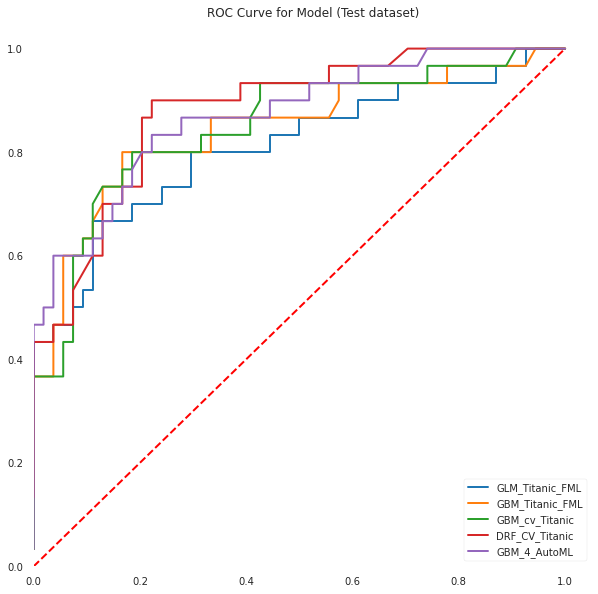

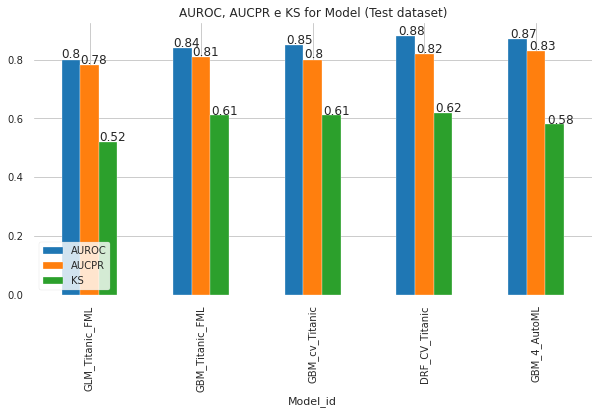

In [25]:
#Compare performance on the TEST dataset for all trained models
plt.rcParams.update({'font.size': 12})
fig = plt.figure(figsize=(10, 10))
for i in list_models:
    #Save all models in H20 format
    h2o.save_model(model=i, path='%s/models/todos/' % OutputPath, force=True)
    #calculate o KS in test dataset
    h2o_predict = i.predict(test_hdf)
    data = h2o_predict.cbind(test_hdf[var_target]).as_data_frame()
    data['target0'] = 1 - data[var_target]
    data['bucket'] = pd.qcut(data['p1'], 10, duplicates='drop', labels=False)
    grouped = data.groupby('bucket', as_index=False)
    kstable = pd.DataFrame()
    kstable['min_prob'] = grouped.min()['p1']
    kstable['max_prob'] = grouped.max()['p1']
    kstable['events'] = grouped.sum()[var_target]
    kstable['nonevents'] = grouped.sum()['target0']    
    kstable = kstable.sort_values(by="min_prob", ascending=False).reset_index(drop=True)
    kstable['event_rate'] = (kstable.events / data[var_target].sum()).apply('{0:.2%}'.format)
    kstable['nonevent_rate'] = (kstable.nonevents / data['target0'].sum()).apply('{0:.2%}'.format)
    kstable['cum_eventrate'] = (kstable.events / data[var_target].sum()).cumsum()
    kstable['cum_noneventrate'] = (kstable.nonevents / data['target0'].sum()).cumsum()
    kstable['KS'] = np.round(kstable['cum_eventrate'] - kstable['cum_noneventrate'], 3)
    ks = kstable['KS'].max()
    
    #Ascertain the performance of all models on the test base
    performance = i.model_performance(test_hdf)
    
    #Salve metrics
    f=open("%s/models/todos/performance_%s.csv" % (OutputPath, i.model_id), 'w')
    f.write(
        str(i.model_id) + ";"
        + str(performance.accuracy()[0][0]) + ";"
        + str(performance.auc()) + ';'
        + str(performance.aucpr()) + ';'
        + str(performance.logloss()) + ';'
        + str(ks) + ';'
        + str(performance.F1()[0][0]))
    f.write('\n')
    f.close()

    #graph with the ROC curve of all models
    fpr = performance.fprs
    tpr = performance.tprs
    plt.plot(fpr, tpr, lw=2, label=i.model_id.split("_")[0]+"_"+i.model_id.split("_")[1]+"_"+i.model_id.split("_")[2])
    plt.title("ROC Curve for Model (Test dataset)")    
    
    if i.model_id==list_models[0].model_id:
        df_plot = pd.DataFrame({'Model_id': i.model_id.split("_")[0]+"_"+i.model_id.split("_")[1]+"_"+i.model_id.split("_")[2],
                                    'AUROC': int(performance.auc()*100)/100,
                                    'AUCPR': int(performance.aucpr()*100)/100,
                                    'KS': int(ks*100)/100
                                    }, index=[0])
    else:
        df_plot = df_plot.append(pd.DataFrame({'Model_id': i.model_id.split("_")[0]+"_"+i.model_id.split("_")[1]+"_"+i.model_id.split("_")[2],
                                    'AUROC': int(performance.auc()*100)/100,
                                    'AUCPR': int(performance.aucpr()*100)/100,
                                    'KS': int(ks*100)/100
                                    }, index=[0]))
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.05])
plt.ylim([0.0, 1.05])
plt.legend(loc="lower right")
plt.show()
plt.close()
ax = df_plot.plot(kind='bar', x="Model_id", title="AUROC, AUCPR e KS for Model (Test dataset)", grid=True, figsize=(10,5), legend=1)
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))
plt.legend(loc=3, prop={'size': 10})

## 6.4 Choose the best model among all tested

In [26]:
#Consider all models in the history ./models/todos/performance_*.csv. To disregard any old version, set erase_modelos = "S":
apagar_modelos = 'N'
if apagar_modelos == 'S':
    os.system('rm %s/models/todos/performance_*.csv' % OutputPath)

In [27]:
sort_metric_best_model='AUCPR'
#importar todos os modelos testados e imprmie na tela os 10 melhores erdedando per AUC
modelos_testados = pd.concat(map(functools.partial(pd.read_csv, sep=';', header=None), glob.glob('%s/models/todos/performance_*.csv' % OutputPath)))
modelos_testados.columns = ('model_id', 'accuracy', 'AUC', 'AUCPR', 'logloss', 'KS', 'F1')
modelos_testados = modelos_testados.sort_values(by=sort_metric_best_model, ascending=False)
modelos_testados = modelos_testados.drop_duplicates(subset=["model_id"])
print('MBest Models. Sorted by : ' + str(sort_metric_best_model))
modelos_testados.reset_index(0).head(30)

MBest Models. Sorted by : AUCPR


,index,model_id,accuracy,AUC,AUCPR,logloss,KS,F1
0,0,GBM_4_AutoML_20210321_210004,0.634834,0.870988,0.837365,0.434703,0.581,0.352362
1,0,DeepLearning_grid__2_AutoML_20210321_200907_model_1,0.564052,0.871605,0.837360,0.421072,0.615,0.249150
2,0,DeepLearning_1_AutoML_20210321_173321,0.781475,0.851235,0.834987,0.452152,0.522,0.781475
3,0,GBM_3_AutoML_20210321_181404,0.638937,0.880864,0.834233,0.420890,0.570,0.237360
4,0,GBM_3_AutoML_20210321_195351,0.638937,0.880864,0.834233,0.420890,0.570,0.237360
5,0,DRF_CV_Titanic_v2_corr_FE20210321_173316,0.407556,0.880247,0.827854,0.425337,0.622,0.393368
6,0,DRF_CV_Titanic_FML_v120210321_205957,0.407556,0.880247,0.827854,0.425337,0.622,0.393368
7,0,DRF_CV_Titanic_FML_v120210321_195301,0.407556,0.880247,0.827854,0.425337,0.622,0.393368
8,0,DRF_CV_Titanic_v2_corr_FE20210321_181358,0.407556,0.880247,0.827854,0.425337,0.622,0.393368
9,0,StackedEnsemble_AllModels_AutoML_20210321_200907,0.655679,0.837654,0.817530,0.438502,0.570,0.339096



BEST MODEL: GBM_4_AutoML_20210321_210004



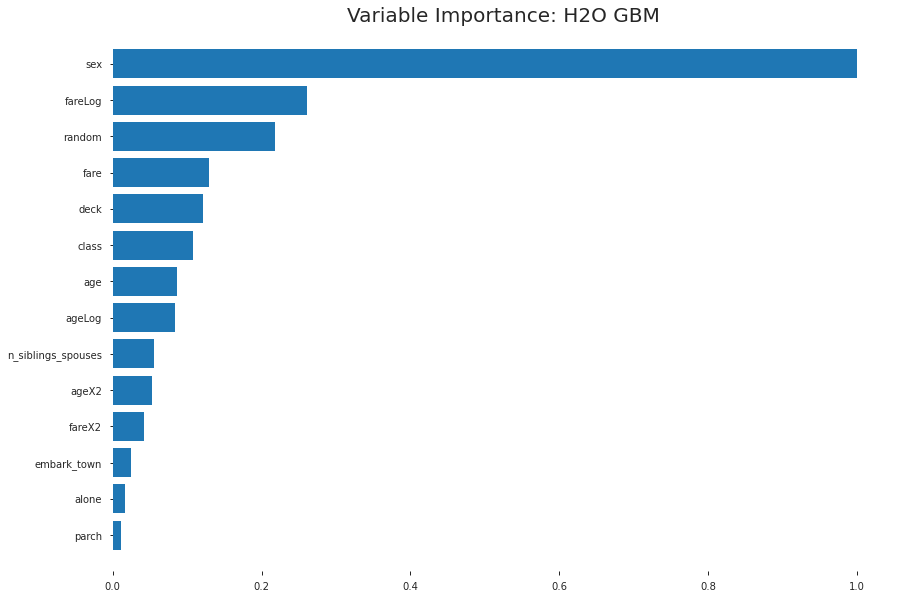

In [28]:
#If you want to choose a model other than the first one on the list. Choose the position number:
posicao_melhor_modelo=0

melhor_modelo = h2o.load_model('%s/models/todos/%s' % (OutputPath, modelos_testados.iloc[posicao_melhor_modelo, 0]))
(print("\n"+ "BEST MODEL: " + str(modelos_testados.iloc[posicao_melhor_modelo, 0]) + "\n"))

plt.rcParams.update({'font.size': 10})
try:
    melhor_modelo.varimp_plot(50)
except Exception as e:
    print("Warning: This model doesn't have variable importances")

## 6.4 Stepwise for Analysis of the importance of variables

In [29]:
#Listar todas as variáveis do modelo atual, ordenadas por variable importance
#Para as variaveis definidas como fator (que possivelmente estão como dummys), remover a categoria do nome e deixar apenas o nome orifinal da variavel

#List all variables in the current model, ordered by variable importance
#For variables defined as a factor (which possibly are like dummys), remove the category from the name and leave only the orifinal name of the variable
try:
    df_features_sorted = melhor_modelo.varimp(True).variable.str.split('.', expand=True).drop_duplicates(subset = 0)[0].reset_index(drop=True)
except Exception as e:
    #As the model with ensemble in H20 does not show the importance of variables, we will include variables with higher IV first using result_formatado graph of step 5.1
    df_features_sorted = result_formated_graph.Variable.reset_index(drop=True)

In [30]:
#Define the number of variables to be increased with each new model. Try to put 10% or 20% of the total, as it can take a long time
qt_var=1
qt_total_var = len(df_features_sorted)

dict_model_tmp={}
dict_performance={}

for i in range(qt_var, qt_total_var+qt_var, qt_var):    
    df_features_sorted[0:i].values.tolist()    
    
    #If no model chosen is not an ensemble of models. Then use the same model for training with increment of variables
    melhor_modelo_tmp = melhor_modelo
    if melhor_modelo_tmp.model_id.lower().find("ensemble") == -1:
        dict_model_tmp[i] = melhor_modelo_tmp
        dict_model_tmp[i].train(x = df_features_sorted[0:i].values.tolist(),
                                y = var_target,
                                training_frame=train_hdf, 
                                validation_frame=valid_hdf)
    ##If it is not possible, for the home of an ensemble of models, use GradientBoostingEstimator to make the assessment
    else:
        dict_model_tmp[i] = H2OGradientBoostingEstimator(seed=1, model_id=str('model_tmp_%s' % i))
        dict_model_tmp[i].train(x = df_features_sorted[0:i].values.tolist(),
                                y = var_target,
                                training_frame=train_hdf, 
                                validation_frame=valid_hdf)       


    perform_oot = dict_model_tmp[i].model_performance(test_hdf)
    dict_performance_tmp = {}
    dict_performance_tmp['AUC'] = {'qt_var': i, 'medida': 'AUC', 'Validation_Dataset': dict_model_tmp[i].auc(valid=True), 'Test_Dataset': perform_oot.auc()}
    dict_performance_tmp['accuracy'] = {'qt_var': i, 'medida': 'accuracy', 'Validation_Dataset': dict_model_tmp[i].accuracy(valid=True)[0][0], 'Test_Dataset': perform_oot.accuracy()[0][0]}
    dict_performance_tmp['AUCPR'] = {'qt_var': i, 'medida': 'AUCPR', 'Validation_Dataset': dict_model_tmp[i].aucpr(valid=True), 'Test_Dataset': perform_oot.aucpr()}
    dict_performance_tmp['F1'] = {'qt_var': i, 'medida': 'F1', 'Validation_Dataset': dict_model_tmp[i].F1(valid=True)[0][0], 'Test_Dataset': perform_oot.F1()[0][0]}
    dict_performance_tmp['logloss'] = {'qt_var': i, 'medida': 'logloss', 'Validation_Dataset': dict_model_tmp[i].logloss(valid=True), 'Test_Dataset': perform_oot.logloss()}
    dict_performance[i] = pd.DataFrame(dict_performance_tmp).transpose()

gbm Model Build progress: |███████████████████████████████████████████████| 100%
gbm Model Build progress: |███████████████████████████████████████████████| 100%
gbm Model Build progress: |███████████████████████████████████████████████| 100%
gbm Model Build progress: |███████████████████████████████████████████████| 100%
gbm Model Build progress: |███████████████████████████████████████████████| 100%
gbm Model Build progress: |███████████████████████████████████████████████| 100%
gbm Model Build progress: |███████████████████████████████████████████████| 100%
gbm Model Build progress: |███████████████████████████████████████████████| 100%
gbm Model Build progress: |███████████████████████████████████████████████| 100%
gbm Model Build progress: |███████████████████████████████████████████████| 100%
gbm Model Build progress: |███████████████████████████████████████████████| 100%
gbm Model Build progress: |███████████████████████████████████████████████| 100%
gbm Model Build progress: |█

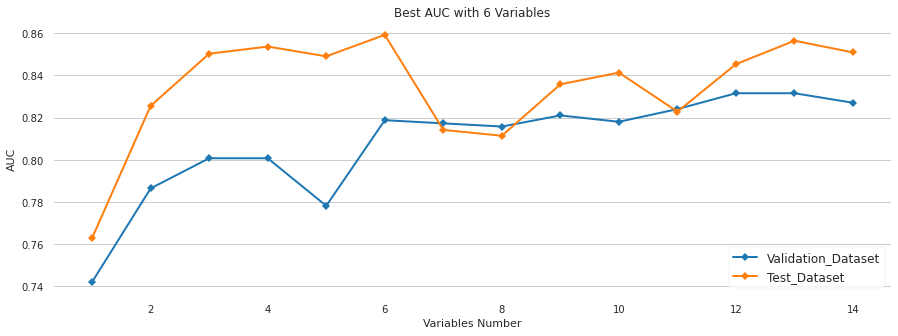

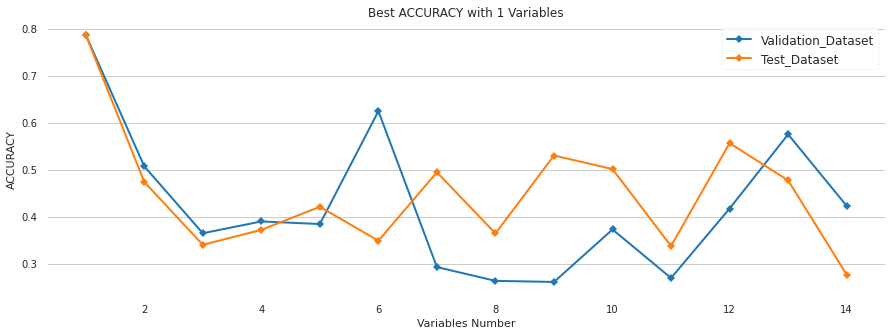

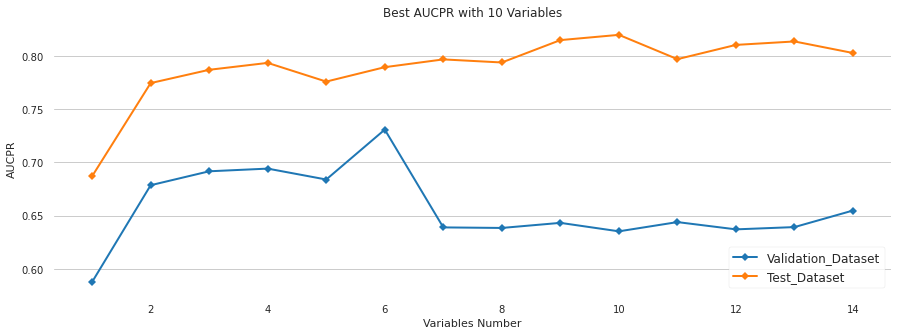

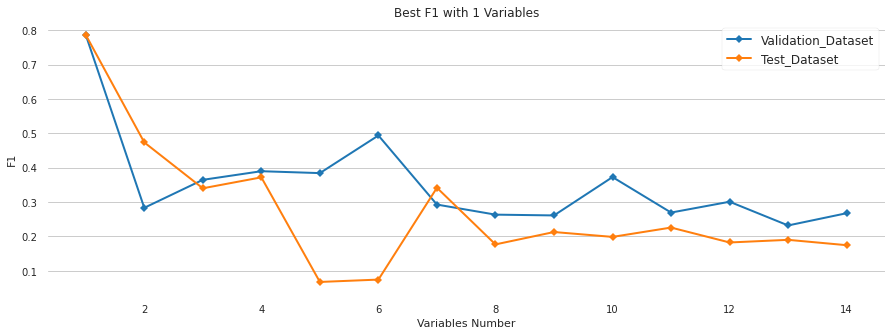

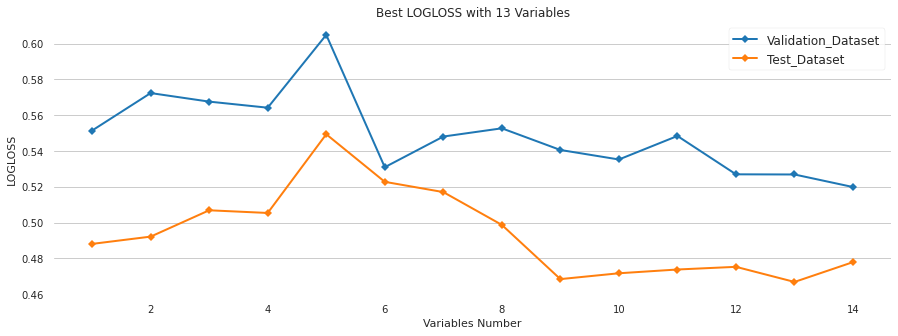

In [31]:
##Plot graph comparing the increase in performance with the increase in variables
for i in dict_performance.keys():
    if i == list(dict_performance.keys())[0]:
        df_performance = dict_performance[i]
    else:
        df_performance = df_performance.append(dict_performance[i], ignore_index=True)

lista_metricas_perf = df_performance['medida'].unique()

for i in range(len(lista_metricas_perf)):   
    #selects only the metric to be analyzed
    metrics_df_tmp = df_performance.query('medida == "%s"' % lista_metricas_perf[i])
    metrics_df_tmp = metrics_df_tmp.set_index('qt_var')
    del metrics_df_tmp['medida']
    if lista_metricas_perf[i] == 'logloss':
        max_oot = metrics_df_tmp[metrics_df_tmp['Test_Dataset'] == metrics_df_tmp.Test_Dataset.min()].index.values
    else:
        max_oot = metrics_df_tmp[metrics_df_tmp['Test_Dataset'] == metrics_df_tmp.Test_Dataset.max()].index.values
        
    if lista_metricas_perf[i] == sort_metric_best_model:
        max_oot_filtro = max_oot[0]        
    
    ax=metrics_df_tmp.plot(figsize=(15,5), linewidth=2, fontsize=10, marker='D', ms=5,\
                            title='Best %s with %s Variables' % (lista_metricas_perf[i].upper(), str(max_oot[0])))
    plt.xlabel('Variables Number')
    plt.ylabel('%s' % lista_metricas_perf[i].upper())
    plt.grid(axis='y')
    plt.legend(loc=0, prop={'size': 12})
    #display(ax)

In [32]:
print('Consider removing the following variables: '+ str(df_features_sorted[df_features_sorted.index > int(max_oot_filtro)].values.tolist()))

Consider removing the following variables: ['embark_town', 'alone', 'parch']


## 6.5 Exporting the best model to Deploy

In [33]:
#Save the H2O model in MOJO format and all the variables of the best model
melhor_modelo = h2o.load_model('%s/models/todos/%s' % (OutputPath, modelos_testados.iloc[posicao_melhor_modelo, 0]))
caminho_modelo_mojo = melhor_modelo.download_mojo('%s/models/melhores/' % OutputPath, get_genmodel_jar=True)
print(caminho_modelo_mojo)
caminho_modelo_h2o = h2o.save_model(model=melhor_modelo, path='%s/models/melhores/' % OutputPath, force=True)

/kaggle/working/C:/tmp/models/melhores/GBM_4_AutoML_20210321_210004.zip


In [34]:
try:
    features_names= melhor_modelo.varimp(True)
    features_names.to_csv('%s/models/melhores/features_names_%s.csv' % (OutputPath, melhor_modelo.model_id), sep=';')
except Exception as e:
    print("Warning: This model doesn't have variable importances")

# 7. Calculate Shapley Values using SHAP KernelExplainer for H20 models

#### The SHAP library calculates the Shaley Value of each variable used in the model and shows the individual impact of each variable on the predicted value for each record. To better understand how the SHAP library works, see the link https://github.com/slundberg/shap

In [35]:
class H2oProbWrapper:
    def __init__(self, h2o_model, feature_names):
        self.h2o_model = h2o_model
        self.feature_names = feature_names
    def predict_binary_prob(self, X):
        if isinstance(X, pd.Series):
            X = X.values.reshape(1,-1) 
        self.dataframe = pd.DataFrame(X, columns=self.feature_names)
        
        global NUM
        #Variaveis explicativas continuas
        for col_name in NUM:    
            self.dataframe[col_name] = self.dataframe[col_name].astype(float)
            
        global CAT
        for col_name in CAT:    
            self.dataframe[col_name] = self.dataframe[col_name].astype(str)
            self.dataframe = self.dataframe.fillna(value={col_name: 'missing'})
        
        self.h2oframe = h2o.H2OFrame(self.dataframe)
        for col_name in CAT:
            self.h2oframe[col_name] = self.h2oframe[col_name].asfactor()
        
        self.predictions = self.h2o_model.predict(self.h2oframe).as_data_frame().values
        return self.predictions.astype('float64') [:,-1]

In [36]:
#The calculation of the Shapley Value for H20 models takes a while. So it will only be done for 20 records. Increase the sample to deepen your analysis
shap_sample = dataprep_df.query('dataset == "test"').loc[:,(selected_features)].sample(n=20, replace=False, random_state=1)
shap_sample = shap_sample.fillna(0)

In [37]:
h2o_wrapper = H2oProbWrapper(melhor_modelo, selected_features)
h2o_explainer = shap.KernelExplainer(h2o_wrapper.predict_binary_prob, shap_sample)
h2o_shap_values = h2o_explainer.shap_values(shap_sample, nsamples="auto")

Parse progress: |█████████████████████████████████████████████████████████| 100%
gbm prediction progress: |████████████████████████████████████████████████| 100%


  0%|          | 0/20 [00:00<?, ?it/s]

Parse progress: |█████████████████████████████████████████████████████████| 100%
gbm prediction progress: |████████████████████████████████████████████████| 100%
Parse progress: |█████████████████████████████████████████████████████████| 100%
gbm prediction progress: |████████████████████████████████████████████████| 100%
Parse progress: |█████████████████████████████████████████████████████████| 100%
gbm prediction progress: |████████████████████████████████████████████████| 100%
Parse progress: |█████████████████████████████████████████████████████████| 100%
gbm prediction progress: |████████████████████████████████████████████████| 100%
Parse progress: |█████████████████████████████████████████████████████████| 100%
gbm prediction progress: |████████████████████████████████████████████████| 100%
Parse progress: |█████████████████████████████████████████████████████████| 100%
gbm prediction progress: |████████████████████████████████████████████████| 100%
Parse progress: |███████████

## Main SHAP Graphics

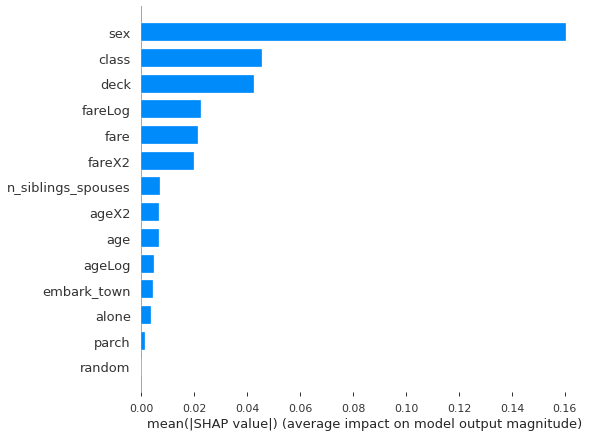

None

In [38]:
fig = shap.summary_plot(h2o_shap_values, shap_sample, plot_type="bar", show=True)
display(fig)

None

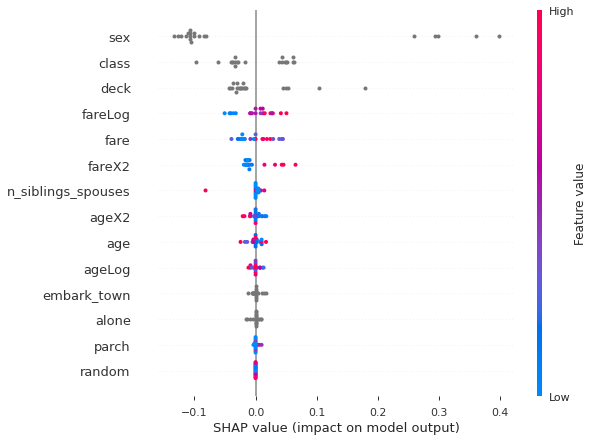

In [39]:
display(shap.summary_plot(h2o_shap_values, shap_sample, show=False))

Passing the fontdict parameter of _set_ticklabels() positionally is deprecated since Matplotlib 3.3; the parameter will become keyword-only two minor releases later.


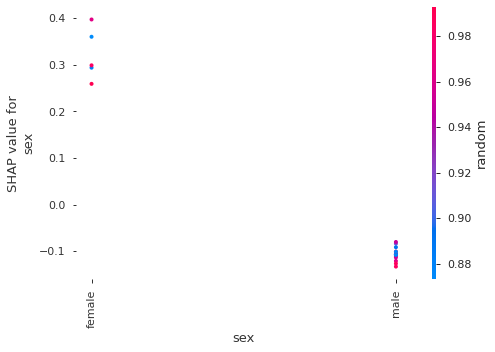

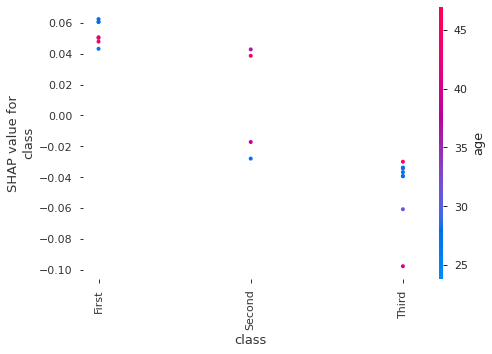

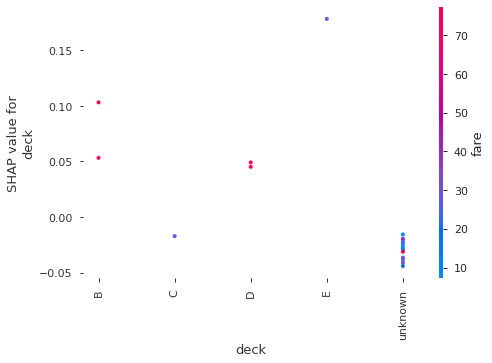

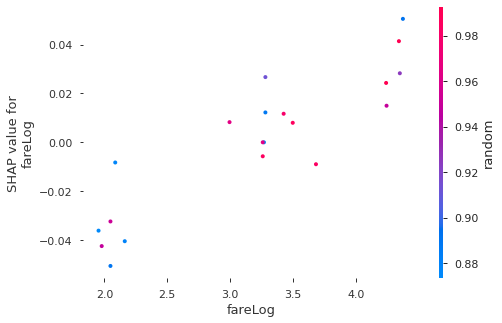

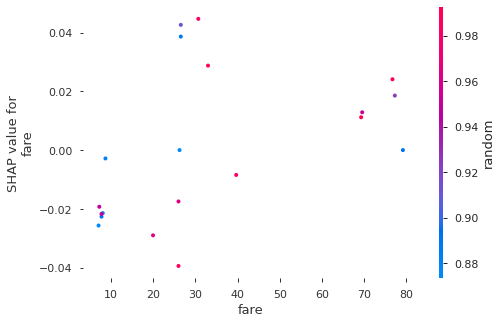

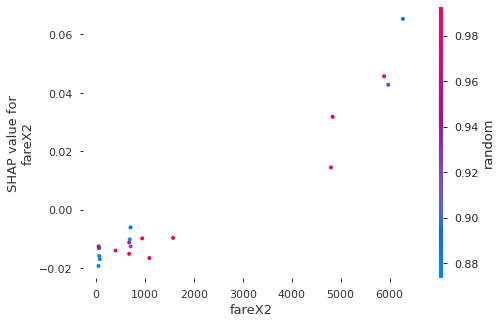

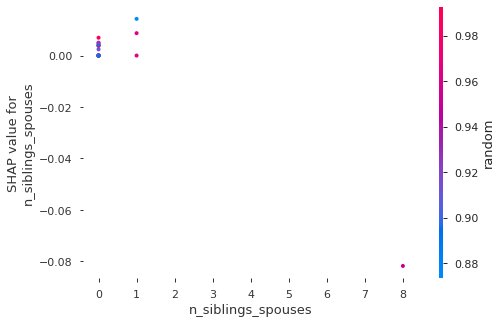

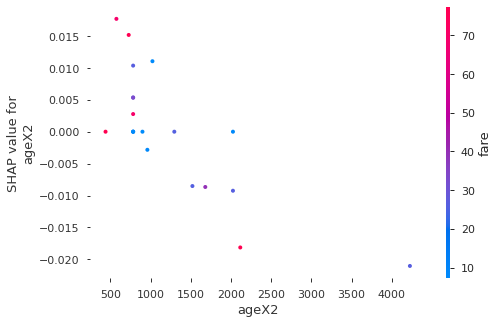

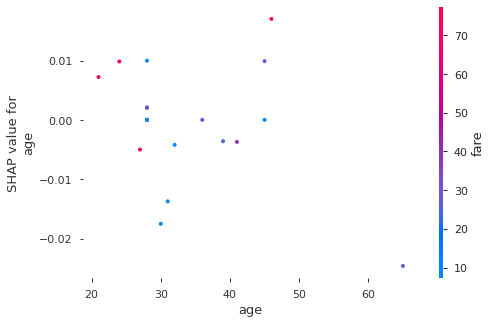

In [40]:
#sort the features indexes by their importance in the model
#(sum of SHAP value magnitudes over the validation dataset)
top_inds = np.argsort(-np.sum(np.abs(h2o_shap_values),0))

#make SHAP plots of the three most important features
for i in range(9):
    fig=shap.dependence_plot(top_inds[i], h2o_shap_values, shap_sample, show=False)
#     display(fig)

In [41]:
df_shap_values = pd.DataFrame(h2o_shap_values)
df_shap_values['sum_shap'] = df_shap_values.sum(axis=1)

### Shap Force Plot

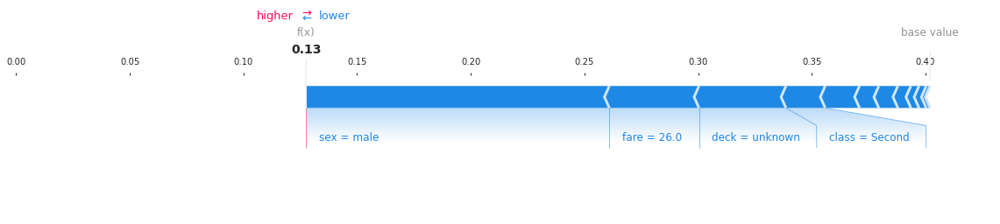

None

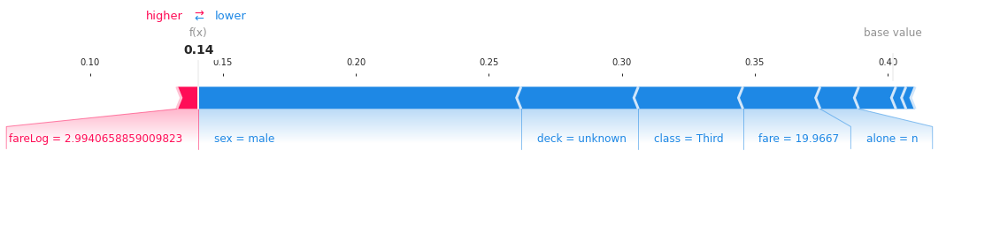

None

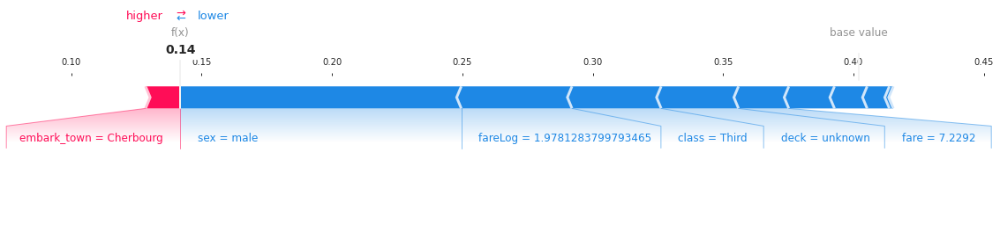

None

In [42]:
for i in df_shap_values.sort_values(by='sum_shap').iloc[0:3,:].index.values:
    fig = shap.force_plot(h2o_explainer.expected_value, h2o_shap_values[i,:], shap_sample.iloc[i,:], matplotlib=True, show=True)
    display(fig)

### Shap Waterfall Plot

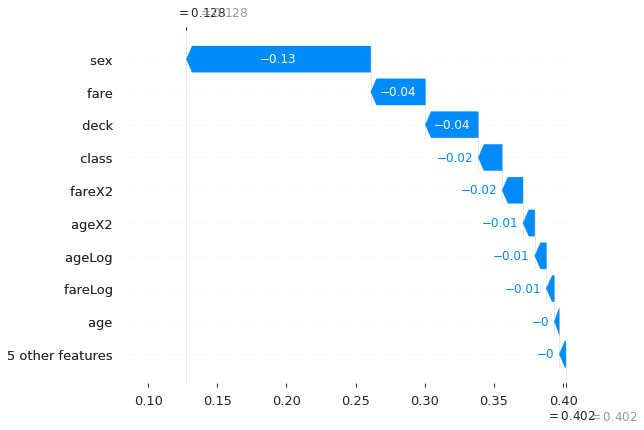

None

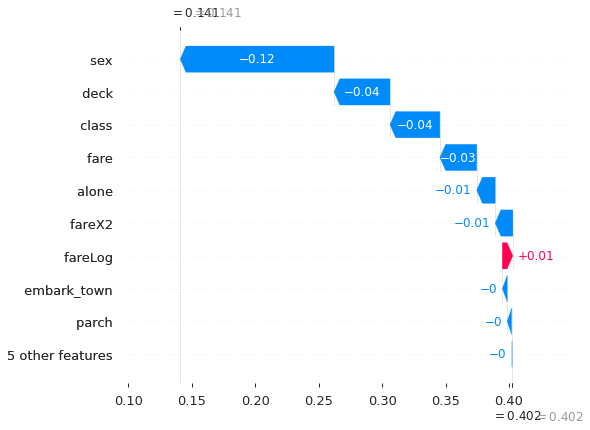

None

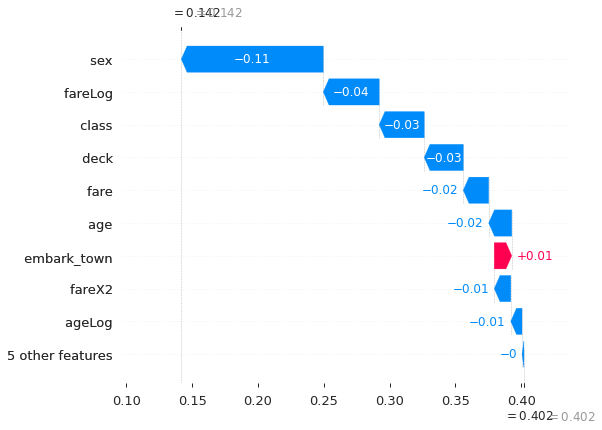

None

In [43]:
for i in df_shap_values.sort_values(by='sum_shap').iloc[0:3,:].index.values:
    fig = shap.plots._waterfall.waterfall_legacy(h2o_explainer.expected_value, h2o_shap_values[i,:], shap_sample.iloc[i,:].to_numpy(), selected_features, show=True)
    display(fig)

# 8. Predict test dataset using MOJO or H2O Model

gbm prediction progress: |████████████████████████████████████████████████| 100%


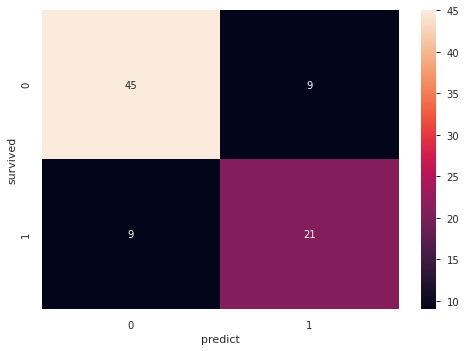

In [44]:
#Importar MOJO
try:
    test_tmp = h2o.mojo_predict_pandas(dataprep_df.query('dataset == "test"'), caminho_modelo_mojo)    
    predict_df = dataprep_df.query('dataset == "test"').merge(test_tmp, left_index=True, right_index=True)
except:
    h2o_predict = melhor_modelo.predict(test_hdf)
    predict_df = h2o_predict.cbind(test_hdf).as_data_frame()
    
predict_df = predict_df.reset_index(drop=True)
predict_df
df_cm = predict_df.groupby(by=[var_target, 'predict']).agg({var_target: ['count']}).reset_index(drop=False)
df_cm.columns = ['_'.join(tup).rstrip('_') for tup in df_cm.columns.values]
df_cm = pd.pivot_table(df_cm, values='survived_count', index=[var_target],
                columns=['predict'], aggfunc=np.sum)
sns.heatmap(df_cm, annot = True,fmt = 'g')
plt.show()

# 9. Save final dataset with predictions

In [45]:
predict_df.to_csv('titanic_predict.csv')

## FIM